In [1]:
# # DC Optimal Power Flow with Topology Switching

# **Author:** Pooja Saji  
# **System:** IEEE 14-bus test case


# ## 1. Setup and Imports

import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import gurobipy as gp
from gurobipy import GRB

# Set display options
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 20)
pd.set_option('display.width', 1000)

print("Libraries loaded successfully!")



Libraries loaded successfully!


In [2]:

# ## 2. Data Loading Functions

def extract_matrix_block(lines, varname):
    """Extract matrix data from MATPOWER .m file"""
    in_block = False
    matrix_lines = []

    for line in lines:
        if line.strip().startswith(f"{varname} = ["):
            in_block = True
            continue
        if in_block:
            if line.strip().startswith("];"):
                break
            clean = re.sub(r'%.*', '', line).strip().rstrip(';')
            if clean:
                matrix_lines.append(clean)

    matrix_data = []
    for line in matrix_lines:
        row = [float(x) for x in line.split()]
        matrix_data.append(row)
    
    return np.array(matrix_data)

def load_case_data(path):
    """Load IEEE case data from MATPOWER file"""
    with open(path, 'r') as f:
        lines = f.readlines()

    bus = extract_matrix_block(lines, 'mpc.bus')
    branch = extract_matrix_block(lines, 'mpc.branch')
    gen = extract_matrix_block(lines, 'mpc.gen')
    gencost = extract_matrix_block(lines, 'mpc.gencost')

    bus_df = pd.DataFrame(bus, columns=[
        'bus_i','type','Pd','Qd','Gs','Bs','area','Vm','Va','baseKV','zone','Vmax','Vmin'
    ])
    gen_df = pd.DataFrame(gen, columns=[
        'bus','Pg','Qg','Qmax','Qmin','Vg','mBase','status','Pmax','Pmin'
    ])
    branch_df = pd.DataFrame(branch, columns=[
        'fbus','tbus','r','x','b','rateA','rateB','rateC',
        'ratio','angle','status','angmin','angmax'
    ])
    gencost_df = pd.DataFrame(gencost, columns=[
        'model','startup','shutdown','n','c2','c1','c0'
    ])
    
    return bus_df, gen_df, branch_df, gencost_df



In [3]:
# ## 3. Load IEEE 14-Bus System

# Update this path to your .m file location
path = 'data/pglib_opf_case14_ieee.m'

bus_df, gen_df, branch_df, gencost_df = load_case_data(path)

print("="*60)
print("IEEE 14-BUS SYSTEM LOADED")
print("="*60)
print(f"Number of Buses: {len(bus_df)}")
print(f"Number of Generators: {len(gen_df)}")
print(f"Number of Branches: {len(branch_df)}")
print(f"Total Load: {bus_df['Pd'].sum():.2f} MW")
print(f"Total Generation Capacity: {gen_df['Pmax'].sum():.2f} MW")

# ### 3.1 System Overview

print("\n--- Bus Information ---")
print(bus_df[['bus_i', 'type', 'Pd', 'Qd', 'Vm', 'Va']].head(10))

print("\n--- Generator Information ---")
print(gen_df[['bus', 'Pg', 'Pmax', 'Pmin', 'status']].head())

print("\n--- Branch Information ---")
print(branch_df[['fbus', 'tbus', 'r', 'x', 'rateA']].head(10))

# ## 4. DC-OPF Solver

def solve_dc_opf(bus_df, gen_df, branch_df, gencost_df, switching=False, verbose=True):
    """
    Solve DC Optimal Power Flow
    
    Parameters:
    - switching: If True, includes binary variables for line switching
    - verbose: Print solver output
    
    Returns:
    - model: Gurobi model object
    - results: Dictionary with solution data
    """
    
    model = gp.Model("DC-OPF")
    if not verbose:
        model.Params.OutputFlag = 0
    
    # Reference bus (slack bus)
    ref_bus = bus_df[bus_df['type'] == 3]['bus_i'].values[0]
    
    # -------- Variables --------
    
    # Generator active power output
    Pg = model.addVars(gen_df.index, lb=0, name="Pg")
    
    # Bus voltage angles (in radians)
    theta = model.addVars(bus_df['bus_i'], lb=-GRB.INFINITY, name="theta")
    
    # Branch power flows
    P_branch = model.addVars(branch_df.index, lb=-GRB.INFINITY, name="P_branch")
    
    # Binary variables for line switching (0 = line off, 1 = line on)
    if switching:
        z = model.addVars(branch_df.index, vtype=GRB.BINARY, name="z")
    
    # -------- Objective Function --------
    
    obj = gp.QuadExpr()
    for idx, row in gencost_df.iterrows():
        obj += row['c2'] * Pg[idx]*Pg[idx] + row['c1'] * Pg[idx] + row['c0']
    model.setObjective(obj, GRB.MINIMIZE)
    
    # -------- Constraints --------
    
    # 1. Reference bus angle = 0
    model.addConstr(theta[ref_bus] == 0, name="ref_bus")
    
    # 2. Generator limits
    for idx, row in gen_df.iterrows():
        model.addConstr(Pg[idx] >= row['Pmin'], name=f"Pg_min_{idx}")
        model.addConstr(Pg[idx] <= row['Pmax'], name=f"Pg_max_{idx}")
    
    # 3. DC power flow equations: P_ij = B_ij * (theta_i - theta_j)
    # Where B_ij = 1/x_ij (susceptance)
    M = 1000  # Big-M value for switching constraints
    
    for idx, row in branch_df.iterrows():
        fbus = row['fbus']
        tbus = row['tbus']
        x = row['x']
        B = 1.0 / x  # Line susceptance
        
        if switching:
            # With switching: P_ij = B * (theta_i - theta_j) * z
            # Linearized as: -M*(1-z) <= P_ij - B*(theta_i - theta_j) <= M*(1-z)
            model.addConstr(
                P_branch[idx] - B * (theta[fbus] - theta[tbus]) <= M * (1 - z[idx]),
                name=f"flow_up_{idx}"
            )
            model.addConstr(
                P_branch[idx] - B * (theta[fbus] - theta[tbus]) >= -M * (1 - z[idx]),
                name=f"flow_lo_{idx}"
            )
            # When line is off (z=0), flow must be zero
            model.addConstr(P_branch[idx] <= M * z[idx], name=f"off_up_{idx}")
            model.addConstr(P_branch[idx] >= -M * z[idx], name=f"off_lo_{idx}")
        else:
            # Without switching: P_ij = B * (theta_i - theta_j)
            model.addConstr(
                P_branch[idx] == B * (theta[fbus] - theta[tbus]),
                name=f"flow_{idx}"
            )
    
    # 4. Line capacity limits
    for idx, row in branch_df.iterrows():
        rateA = row['rateA']
        if rateA > 0:
            if switching:
                # Only enforce when line is on
                model.addConstr(P_branch[idx] <= rateA * z[idx], name=f"cap_up_{idx}")
                model.addConstr(P_branch[idx] >= -rateA * z[idx], name=f"cap_lo_{idx}")
            else:
                model.addConstr(P_branch[idx] <= rateA, name=f"cap_up_{idx}")
                model.addConstr(P_branch[idx] >= -rateA, name=f"cap_lo_{idx}")
    
    # 5. Power balance at each bus (DC approximation: lossless)
    for idx, row in bus_df.iterrows():
        bus = row['bus_i']
        Pd = row['Pd']
        
        # Generators at this bus
        gen_at_bus = gen_df[gen_df['bus'] == bus].index.tolist()
        gen_P = gp.quicksum(Pg[g] for g in gen_at_bus) if gen_at_bus else 0
        
        # Net branch flow (injection - withdrawal)
        branch_out = gp.quicksum(
            P_branch[br] for br in branch_df[branch_df['fbus'] == bus].index
        )
        branch_in = gp.quicksum(
            P_branch[br] for br in branch_df[branch_df['tbus'] == bus].index
        )
        
        # Power balance: Generation - Load = Net outflow
        model.addConstr(gen_P - Pd == branch_out - branch_in, name=f"balance_{bus}")
    
    # -------- Solve --------
    
    model.optimize()
    
    # -------- Extract Results --------
    
    if model.status == GRB.OPTIMAL:
        results = {
            'status': 'optimal',
            'obj_value': model.objVal,
            'Pg': {k: Pg[k].X for k in Pg.keys()},
            'theta': {k: theta[k].X for k in theta.keys()},
            'P_branch': {k: P_branch[k].X for k in P_branch.keys()},
        }
        
        if switching:
            results['z'] = {k: z[k].X for k in z.keys()}
        
        return model, results
    else:
        return model, {'status': 'infeasible'}



IEEE 14-BUS SYSTEM LOADED
Number of Buses: 14
Number of Generators: 5
Number of Branches: 20
Total Load: 259.00 MW
Total Generation Capacity: 399.00 MW

--- Bus Information ---
   bus_i  type    Pd    Qd   Vm   Va
0    1.0   3.0   0.0   0.0  1.0  0.0
1    2.0   2.0  21.7  12.7  1.0  0.0
2    3.0   2.0  94.2  19.0  1.0  0.0
3    4.0   1.0  47.8  -3.9  1.0  0.0
4    5.0   1.0   7.6   1.6  1.0  0.0
5    6.0   2.0  11.2   7.5  1.0  0.0
6    7.0   1.0   0.0   0.0  1.0  0.0
7    8.0   2.0   0.0   0.0  1.0  0.0
8    9.0   1.0  29.5  16.6  1.0  0.0
9   10.0   1.0   9.0   5.8  1.0  0.0

--- Generator Information ---
   bus     Pg   Pmax  Pmin  status
0  1.0  170.0  340.0   0.0     1.0
1  2.0   29.5   59.0   0.0     1.0
2  3.0    0.0    0.0   0.0     1.0
3  6.0    0.0    0.0   0.0     1.0
4  8.0    0.0    0.0   0.0     1.0

--- Branch Information ---
   fbus  tbus        r        x  rateA
0   1.0   2.0  0.01938  0.05917  472.0
1   1.0   5.0  0.05403  0.22304  128.0
2   2.0   3.0  0.04699  0.1979

In [4]:

# ## 5. Results Analysis Functions

# %%
def analyze_results(results, bus_df, gen_df, branch_df, gencost_df):
    """Create DataFrames with bus and branch results"""
    
    if results['status'] != 'optimal':
        return None, None
    
    # Bus results
    bus_results = []
    for idx, row in bus_df.iterrows():
        bus = row['bus_i']
        gen_at_bus = gen_df[gen_df['bus'] == bus].index.tolist()
        
        Pg_total = sum(results['Pg'][g] for g in gen_at_bus) if gen_at_bus else 0
        
        # Calculate cost for this bus
        cost = 0
        for g in gen_at_bus:
            pg = results['Pg'][g]
            c2, c1, c0 = gencost_df.loc[g, ['c2', 'c1', 'c0']]
            cost += c2 * pg**2 + c1 * pg + c0
        
        bus_results.append({
            'Bus': int(bus),
            'Theta (deg)': round(np.degrees(results['theta'][bus]), 2),
            'Pg (MW)': round(Pg_total, 2),
            'Pd (MW)': round(row['Pd'], 2),
            'Cost ($)': round(cost, 2)
        })
    
    bus_result_df = pd.DataFrame(bus_results)
    
    # Branch results
    branch_results = []
    for idx, row in branch_df.iterrows():
        fbus = int(row['fbus'])
        tbus = int(row['tbus'])
        flow = results['P_branch'][idx]
        rateA = row['rateA']
        
        utilization = abs(flow) / rateA * 100 if rateA > 0 else 0
        is_congested = utilization > 95  # Consider congested if >95% utilized
        
        result = {
            'Line': idx,
            'From': fbus,
            'To': tbus,
            'Flow (MW)': round(flow, 2),
            'Limit (MW)': int(rateA),
            'Utilization (%)': round(utilization, 1),
            'Congested': is_congested
        }
        
        if 'z' in results:
            result['Status'] = 'ON' if results['z'][idx] > 0.5 else 'OFF'
        
        branch_results.append(result)
    
    branch_result_df = pd.DataFrame(branch_results)
    
    return bus_result_df, branch_result_df



In [5]:

# ## 6. Visualization Functions

def visualize_opf_results(bus_result_df, branch_result_df, gen_df, title="DC-OPF Results"):
    """Visualize the power network with flow results"""
    
    # Build graph
    G = nx.DiGraph()
    for _, row in bus_result_df.iterrows():
        G.add_node(int(row['Bus']))
    
    for _, row in branch_result_df.iterrows():
        if 'Status' not in row or row['Status'] == 'ON':
            fbus = int(row['From'])
            tbus = int(row['To'])
            flow = row['Flow (MW)']
            
            if flow >= 0:
                G.add_edge(fbus, tbus, flow=flow)
            else:
                G.add_edge(tbus, fbus, flow=-flow)
    
    # Layout
    pos = nx.kamada_kawai_layout(G)
    scale_factor = 4
    for node in pos:
        pos[node] = scale_factor * pos[node]
    
    # Node colors
    gen_buses = set(gen_df['bus'].astype(int))
    node_colors = ['lightcoral' if node in gen_buses else 'skyblue' for node in G.nodes]
    
    # Create figure
    plt.figure(figsize=(18, 12))
    
    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=1200, edgecolors='black')
    
    # Bus labels
    bus_labels = {node: str(int(node)) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=bus_labels, font_size=12, font_weight='bold')
    
    # Pg/Pd info below nodes
    for _, row in bus_result_df.iterrows():
        node = row['Bus']
        x, y = pos[node]
        if row['Pg (MW)'] > 0.1:
            text = f"Pg={row['Pg (MW)']}\nPd={row['Pd (MW)']}"
        else:
            text = f"Pd={row['Pd (MW)']}"
        plt.text(x, y - 0.15, text, fontsize=9, ha='center', va='top', fontweight='bold')
    
    # Draw edges with different colors for congested lines
    edge_colors = []
    edge_widths = []
    edge_list = []
    
    for _, row in branch_result_df.iterrows():
        if 'Status' in row and row['Status'] == 'OFF':
            continue
            
        flow = row['Flow (MW)']
        fbus = int(row['From'])
        tbus = int(row['To'])
        
        if flow >= 0:
            edge_list.append((fbus, tbus))
        else:
            edge_list.append((tbus, fbus))
            flow = -flow
        
        # Color congested lines red
        if row['Congested']:
            edge_colors.append('red')
            edge_widths.append(4)
        else:
            edge_colors.append('gray')
            edge_widths.append(2 + 0.02 * flow)
    
    nx.draw_networkx_edges(
        G, pos, edgelist=edge_list,
        width=edge_widths,
        edge_color=edge_colors,
        arrowsize=30,
        connectionstyle='arc3,rad=0.06',
        arrowstyle='-|>',
        min_source_margin=20,
        min_target_margin=20
    )
    
    # Branch flow labels
    for _, row in branch_result_df.iterrows():
        if 'Status' in row and row['Status'] == 'OFF':
            continue
            
        fbus = int(row['From'])
        tbus = int(row['To'])
        flow = abs(row['Flow (MW)'])
        limit = row['Limit (MW)']
        util = row['Utilization (%)']
        
        x0, y0 = pos[fbus]
        x1, y1 = pos[tbus]
        xm = 0.4 * x0 + 0.6 * x1
        ym = 0.4 * y0 + 0.6 * y1
        
        angle_rad = np.arctan2(y1 - y0, x1 - x0)
        angle_deg = np.degrees(angle_rad)
        if angle_deg > 90 or angle_deg < -90:
            angle_deg += 180
        
        dx, dy = y1 - y0, x0 - x1
        norm = np.sqrt(dx**2 + dy**2)
        offset = 0.02 * dx / norm, 0.02 * dy / norm
        
        color = 'red' if row['Congested'] else 'darkblue'
        label = f"{flow:.1f}/{limit}\n({util:.0f}%)"
        
        plt.text(xm + offset[0], ym + offset[1], label,
                fontsize=8, color=color, fontweight='bold',
                ha='center', rotation=angle_deg)
    
    # Title and cost
    total_cost = bus_result_df['Cost ($)'].sum()
    plt.title(title, fontsize=18, pad=20)
    plt.text(0.5, 0.98, f"Total Cost = ${total_cost:.2f}",
            fontsize=14, color='darkgreen', ha='center',
            fontweight='bold', transform=plt.gca().transAxes)
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()



BASELINE DC-OPF (No Switching)
Set parameter Username
Set parameter LicenseID to value 2656954
Academic license - for non-commercial use only - expires 2026-04-26
Gurobi Optimizer version 12.0.3 build v12.0.3rc0 (mac64[arm] - Darwin 23.6.0 23H420)

CPU model: Apple M2 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 85 rows, 39 columns and 156 nonzeros
Model fingerprint: 0x6c3de0f4
Coefficient statistics:
  Matrix range     [1e+00, 2e+01]
  Objective range  [8e+00, 2e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e+00, 7e+02]
Presolve removed 80 rows and 33 columns
Presolve time: 0.00s
Presolved: 5 rows, 6 columns, 18 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.279316e+02   0.000000e+00      0s
       2    2.0515263e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds (0.00 work units)
Optimal objective  2.051526309e+03

✓ Optim

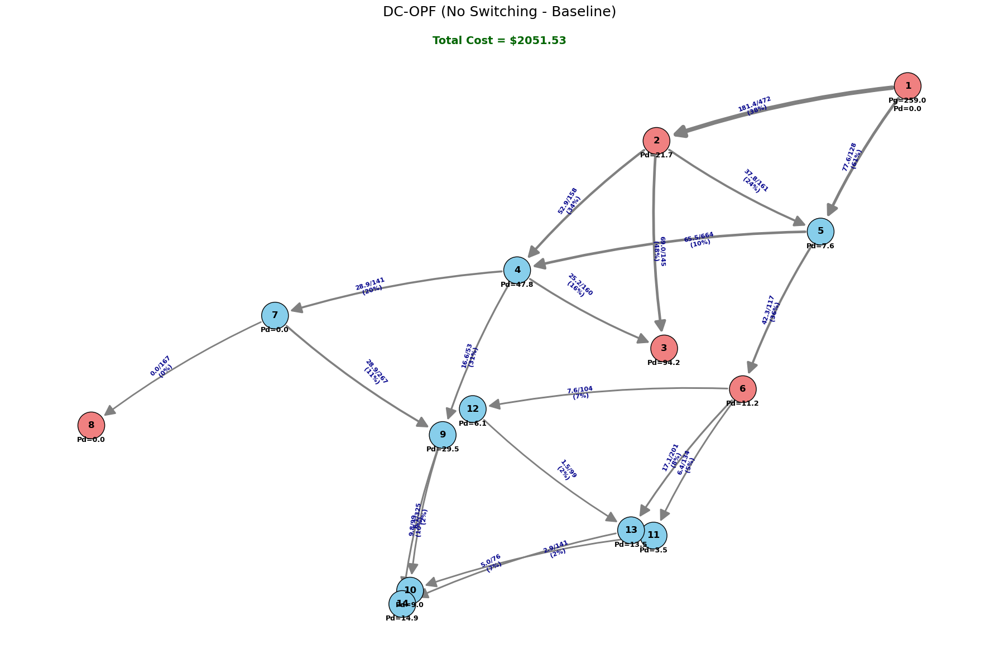

DC-OPF WITH TOPOLOGY SWITCHING
Gurobi Optimizer version 12.0.3 build v12.0.3rc0 (mac64[arm] - Darwin 23.6.0 23H420)

CPU model: Apple M2 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 145 rows, 59 columns and 376 nonzeros
Model fingerprint: 0x916540f9
Variable types: 39 continuous, 20 integer (20 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+03]
  Objective range  [8e+00, 2e+01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [4e+00, 1e+03]
Presolve removed 70 rows and 13 columns
Presolve time: 0.00s
Presolved: 75 rows, 46 columns, 246 nonzeros
Variable types: 27 continuous, 19 integer (19 binary)
Found heuristic solution: objective 2051.5263090

Root relaxation: cutoff, 59 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0     cutoff    0      2051.526

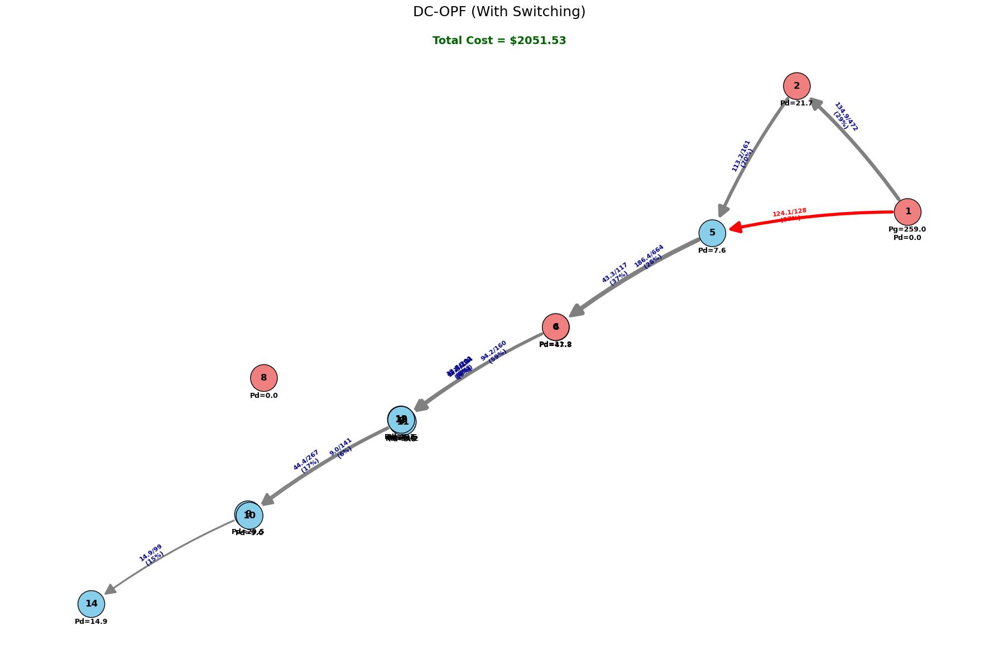

In [6]:

# ## 7. Baseline DC-OPF (No Switching)

print("="*60)
print("BASELINE DC-OPF (No Switching)")
print("="*60)

model, results = solve_dc_opf(bus_df, gen_df, branch_df, gencost_df, switching=False)
bus_res, branch_res = analyze_results(results, bus_df, gen_df, branch_df, gencost_df)

print(f"\n✓ Optimal Cost: ${results['obj_value']:.2f}\n")

# ### 7.1 Congestion Analysis

# %%
print("--- Congested Lines (>95% Utilization) ---")
congested = branch_res[branch_res['Congested']].copy()
if len(congested) > 0:
    print(congested)
else:
    print("No congested lines at baseline load.")

print(f"\n--- Top 5 Most Utilized Lines ---")
print(branch_res.nlargest(5, 'Utilization (%)')[['Line', 'From', 'To', 'Flow (MW)', 'Limit (MW)', 'Utilization (%)']])

# ### 7.2 Network Visualization (Baseline)

# %%
visualize_opf_results(bus_res, branch_res, gen_df, "DC-OPF (No Switching - Baseline)")

# ## 8. DC-OPF with Topology Switching

# %%
print("="*60)
print("DC-OPF WITH TOPOLOGY SWITCHING")
print("="*60)

model_sw, results_sw = solve_dc_opf(bus_df, gen_df, branch_df, gencost_df, switching=True)
bus_res_sw, branch_res_sw = analyze_results(results_sw, bus_df, gen_df, branch_df, gencost_df)

print(f"\n✓ Optimal Cost: ${results_sw['obj_value']:.2f}")
print(f"Cost Reduction: ${results['obj_value'] - results_sw['obj_value']:.2f} ({(1 - results_sw['obj_value']/results['obj_value'])*100:.2f}%)\n")

# ### 8.1 Switching Analysis

# %%
print("--- Lines Switched OFF ---")
switched_off = branch_res_sw[branch_res_sw['Status'] == 'OFF'].copy()
if len(switched_off) > 0:
    print(switched_off[['Line', 'From', 'To', 'Status']])
else:
    print("No lines switched off at baseline load.")

print(f"\n--- Congested Lines (>95% Utilization) ---")
congested_sw = branch_res_sw[branch_res_sw['Congested']].copy()
if len(congested_sw) > 0:
    print(congested_sw)
else:
    print("No congested lines with switching enabled.")

# ### 8.2 Network Visualization (With Switching)

# %%
visualize_opf_results(bus_res_sw, branch_res_sw, gen_df, "DC-OPF (With Switching)")

# ## 9. Load Scaling Study

# %%
def generate_load_scenarios(bus_df, scale_range=(0.85, 1.2), num_points=21):
    """Generate multiple load scenarios by scaling uniformly"""
    scenarios = []
    scales = np.linspace(scale_range[0], scale_range[1], num_points)
    
    for scale in scales:
        scenario_df = bus_df.copy()
        scenario_df['Pd'] = bus_df['Pd'] * scale
        scenario_df['Qd'] = bus_df['Qd'] * scale
        scenarios.append((scale, scenario_df))
    
    return scenarios

def run_load_study(bus_df, gen_df, branch_df, gencost_df, switching=False):
    """Run DC-OPF for multiple load scenarios"""
    scenarios = generate_load_scenarios(bus_df)
    study_results = []
    
    print(f"\n{'='*60}")
    print(f"Running load study ({'WITH' if switching else 'WITHOUT'} switching)...")
    print(f"{'='*60}\n")
    
    for scale, scenario_bus_df in scenarios:
        model, results = solve_dc_opf(
            scenario_bus_df, gen_df, branch_df, gencost_df, 
            switching=switching, verbose=False
        )
        
        if results['status'] == 'optimal':
            bus_res, branch_res = analyze_results(
                results, scenario_bus_df, gen_df, branch_df, gencost_df
            )
            
            num_congested = branch_res['Congested'].sum()
            max_util = branch_res['Utilization (%)'].max()
            
            result = {
                'scale': scale,
                'status': 'optimal',
                'cost': results['obj_value'],
                'num_congested': num_congested,
                'max_utilization': max_util
            }
            
            if switching:
                result['num_lines_on'] = sum(1 for v in results['z'].values() if v > 0.5)
                result['num_lines_off'] = sum(1 for v in results['z'].values() if v <= 0.5)
            
            study_results.append(result)
            
            print(f"Scale {scale:.2f}: Cost=${results['obj_value']:.2f}, "
                  f"Congested={num_congested}, Max Util={max_util:.1f}%")
        else:
            print(f"Scale {scale:.2f}: INFEASIBLE")
            study_results.append({
                'scale': scale,
                'status': 'infeasible'
            })
    
    return pd.DataFrame(study_results)



GENERATING VISUALIZATIONS FOR ALL LOAD SCENARIOS

Processing scale 0.85...


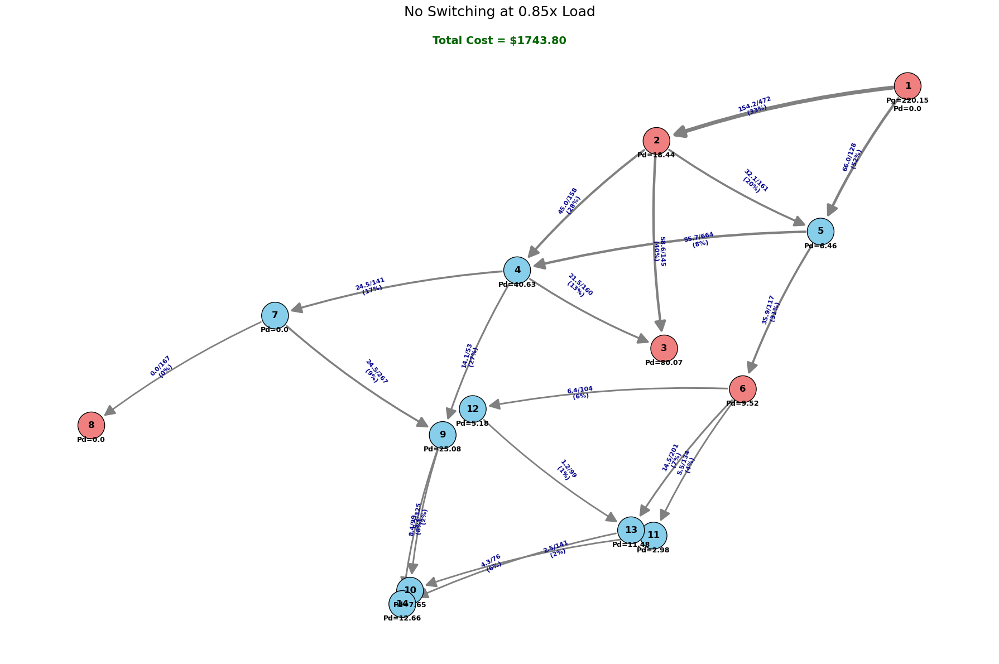

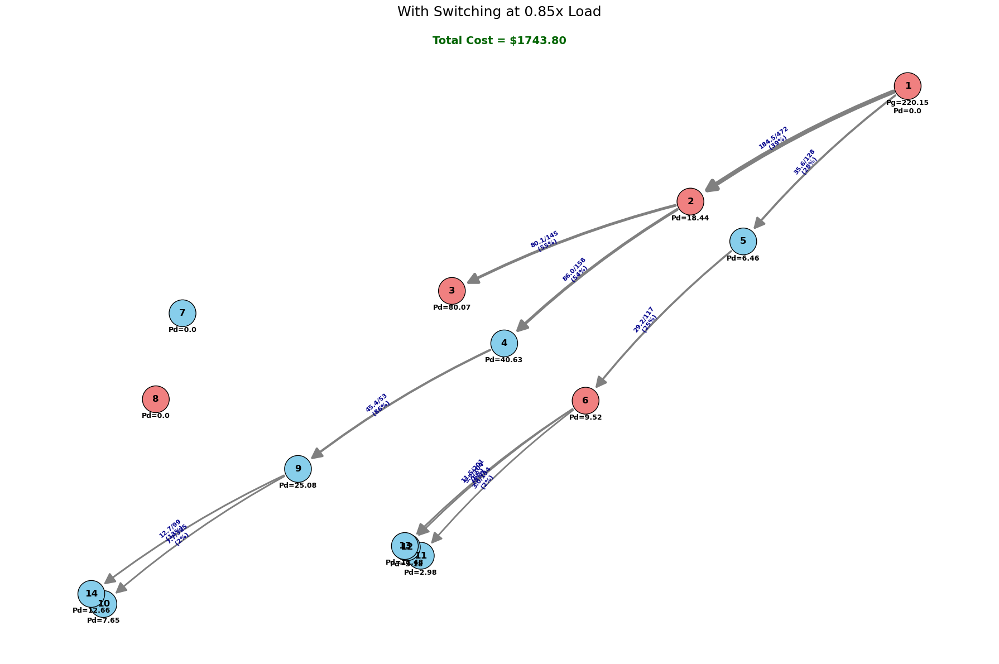


Processing scale 0.87...


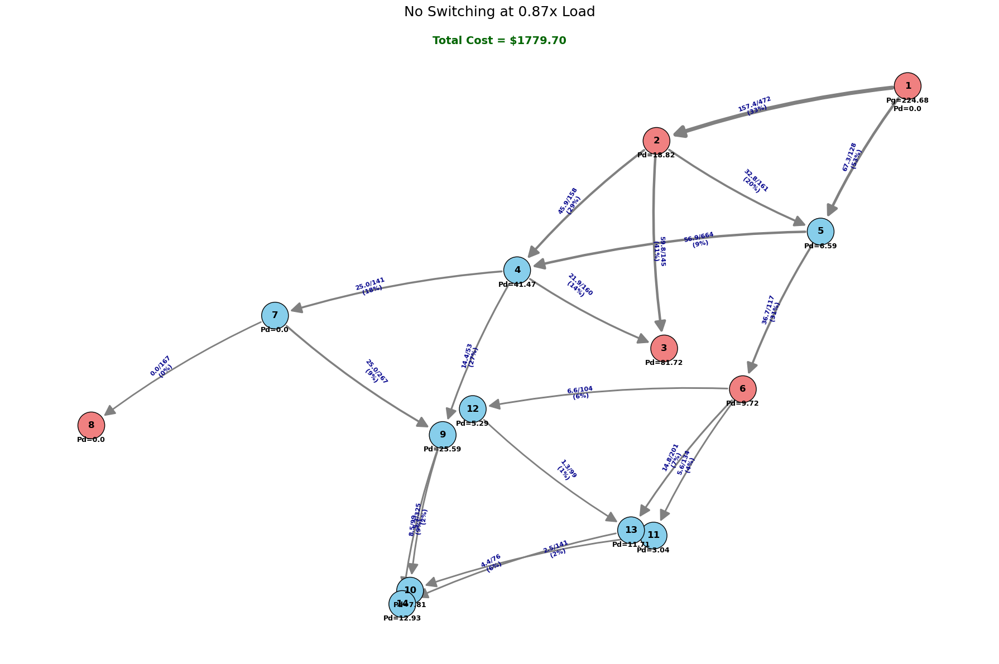

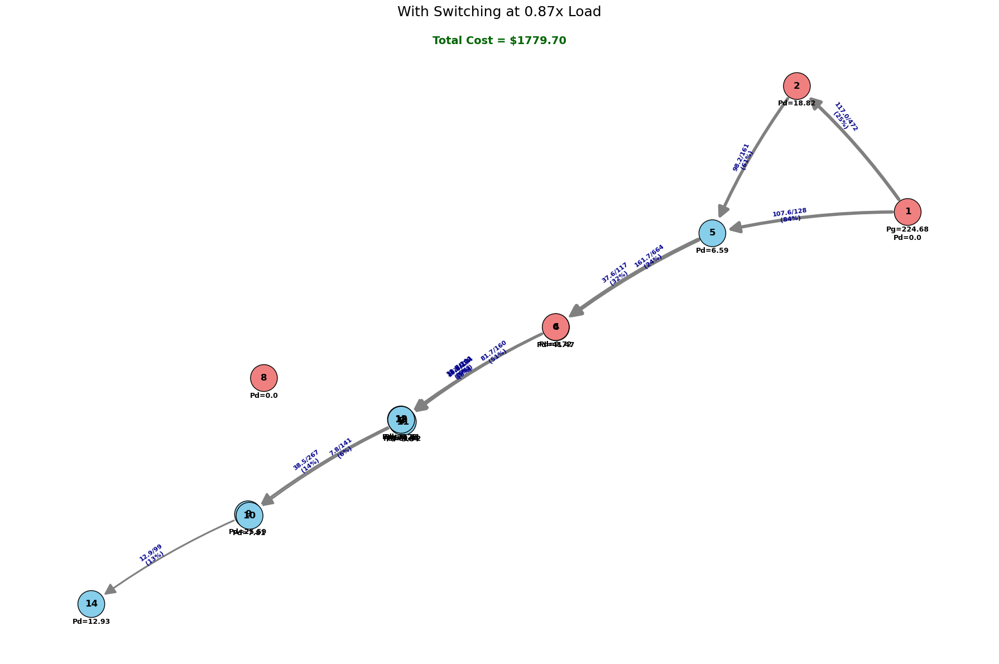


Processing scale 0.89...


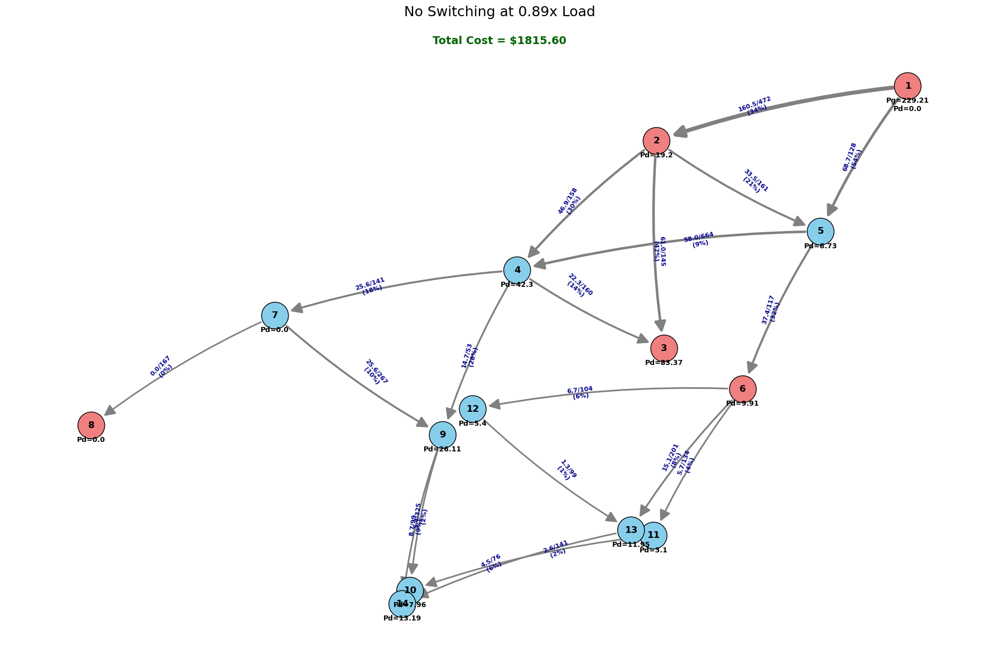

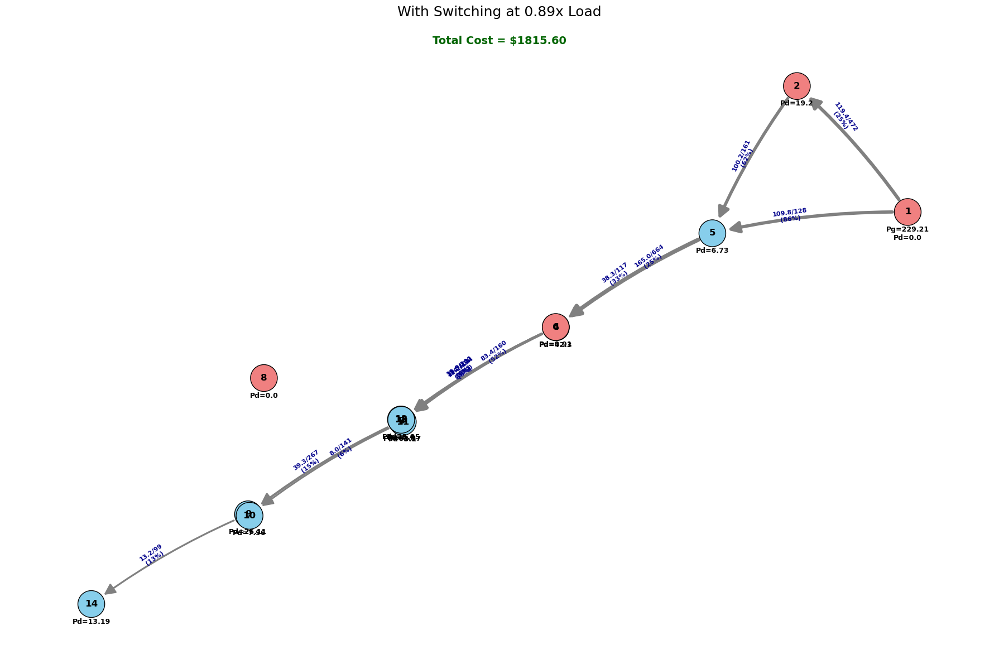


Processing scale 0.90...


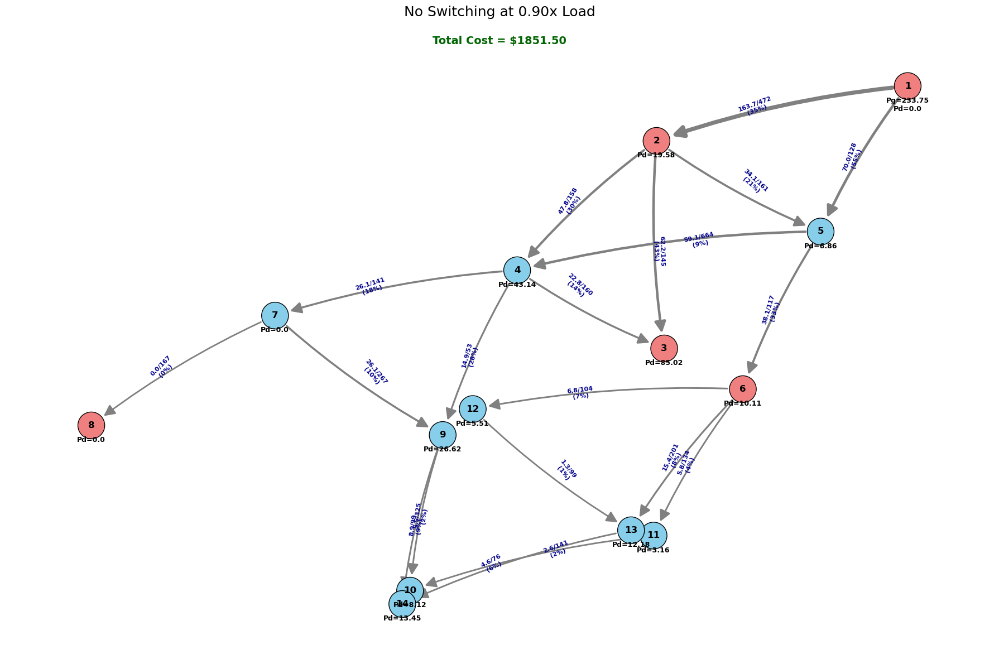

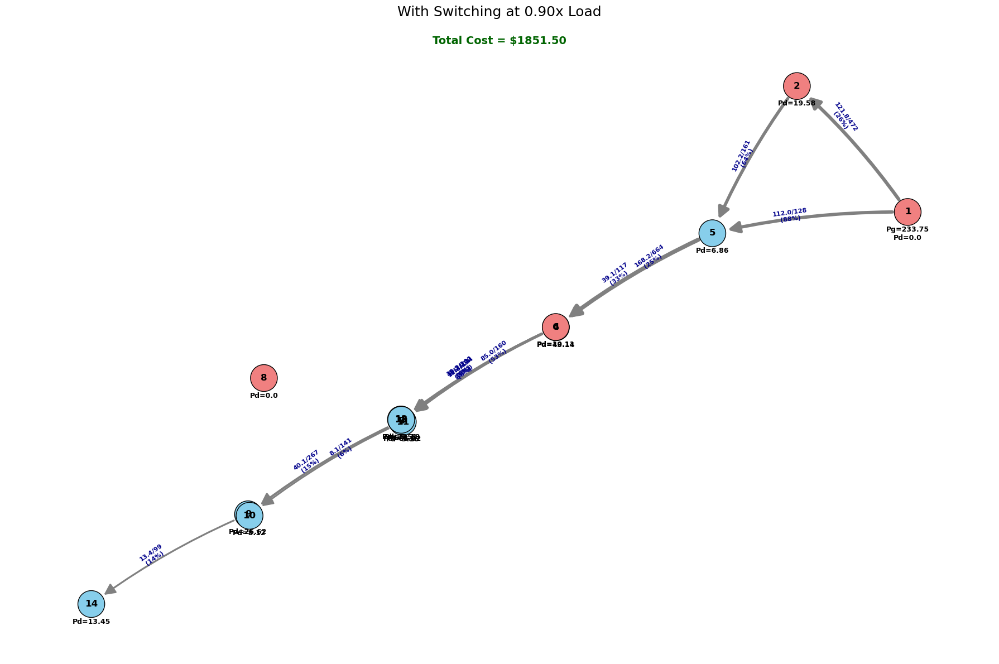


Processing scale 0.92...


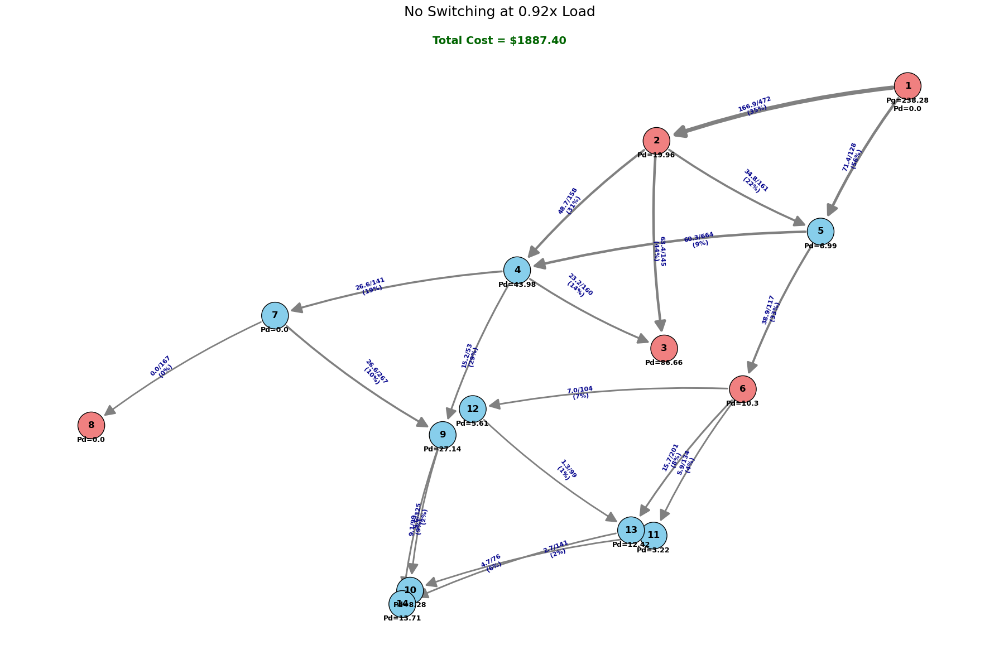

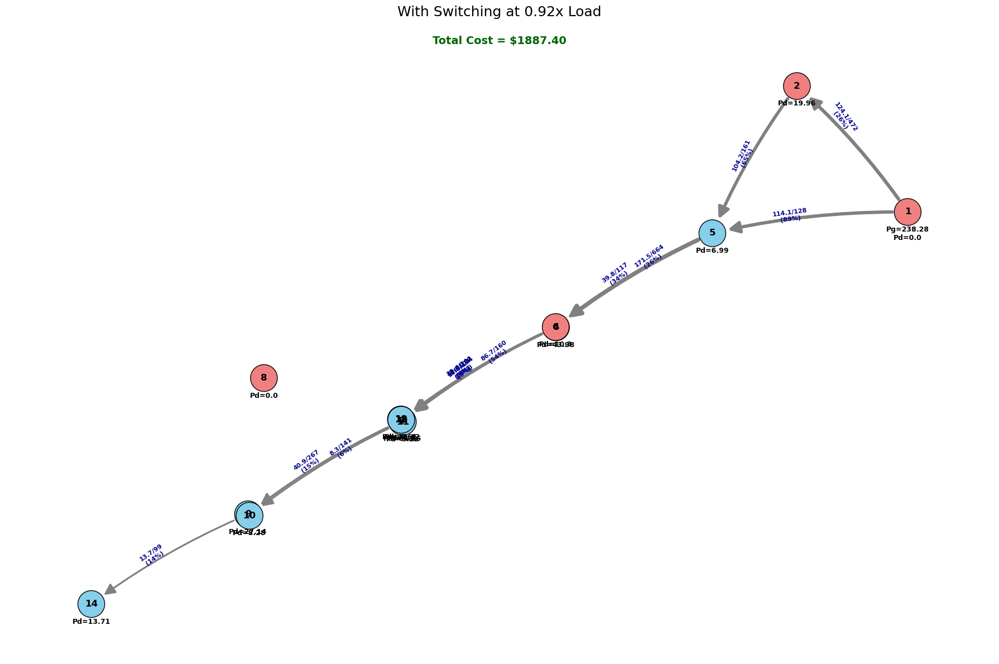


Processing scale 0.94...


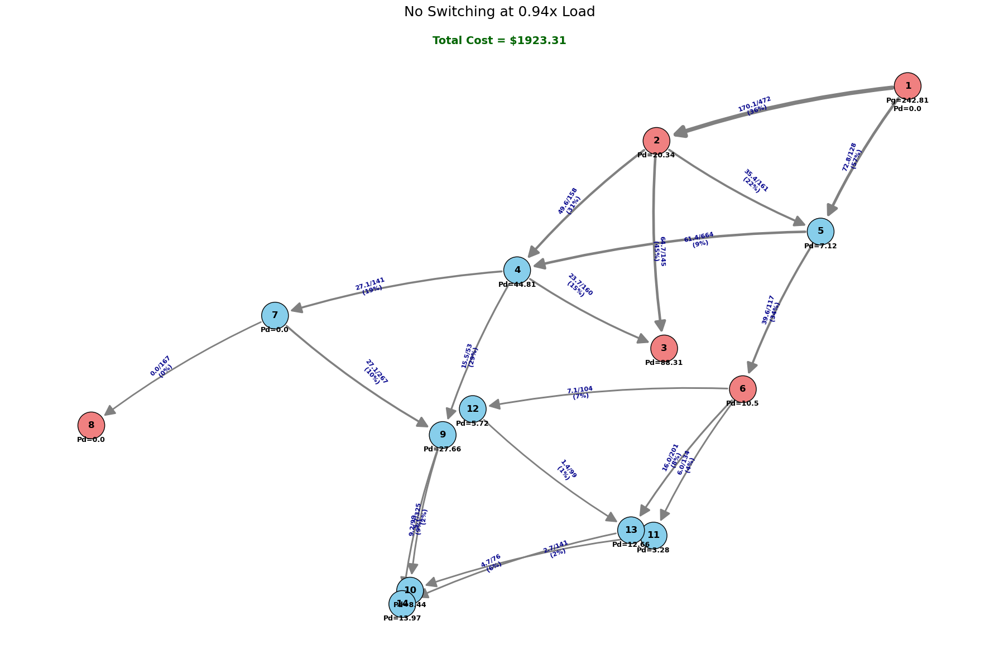

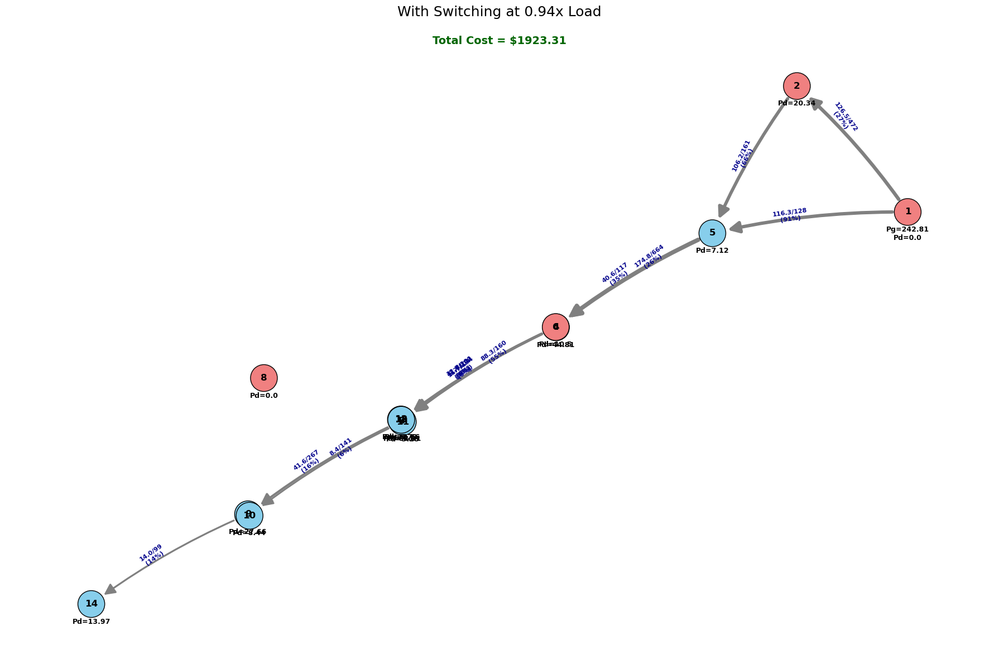


Processing scale 0.95...


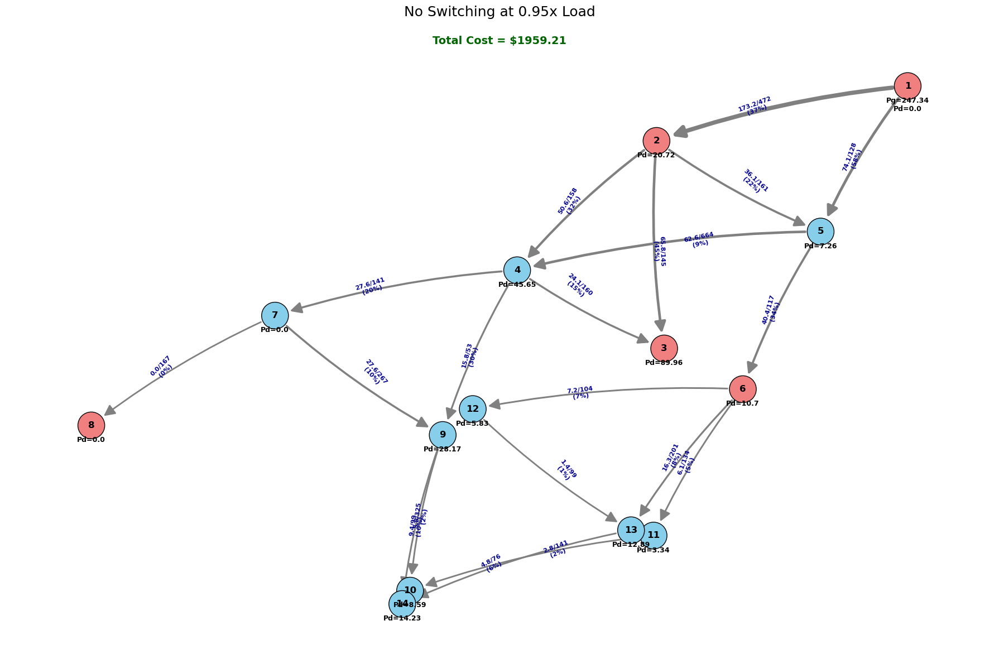

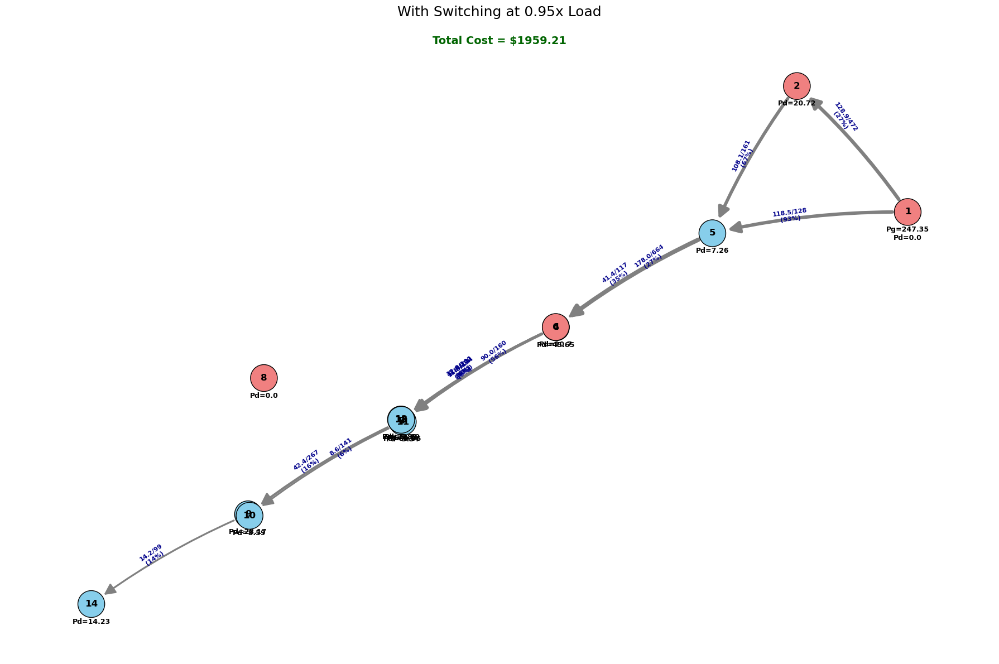


Processing scale 0.97...


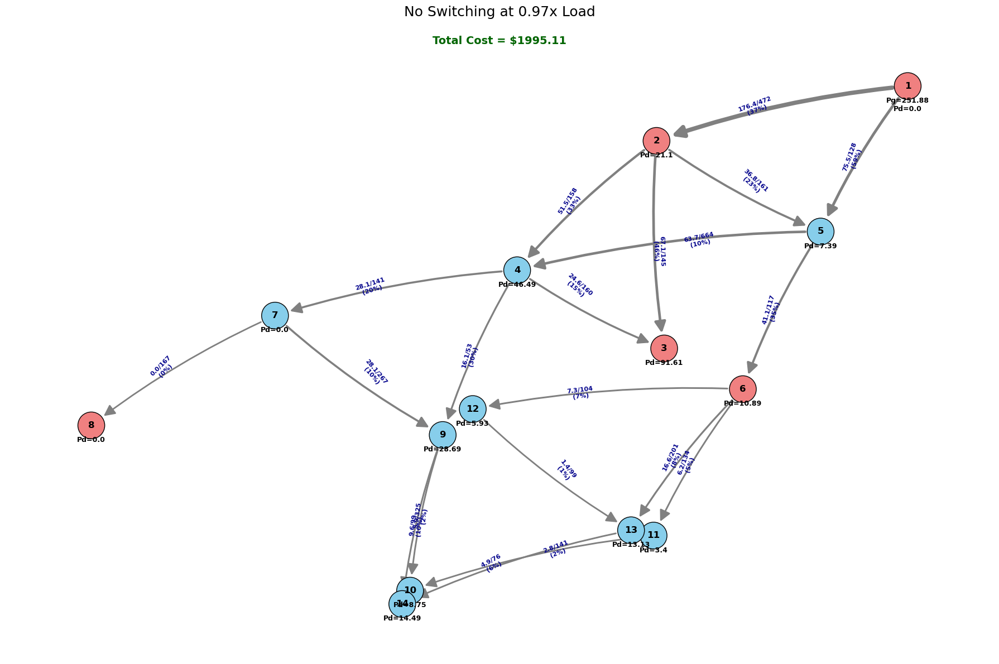

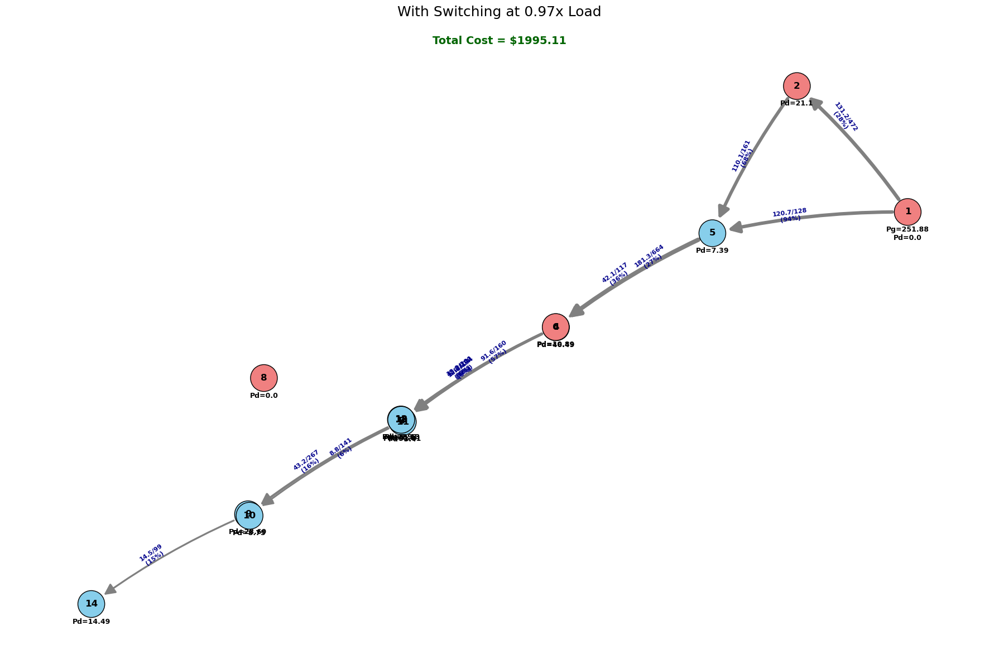


Processing scale 0.99...


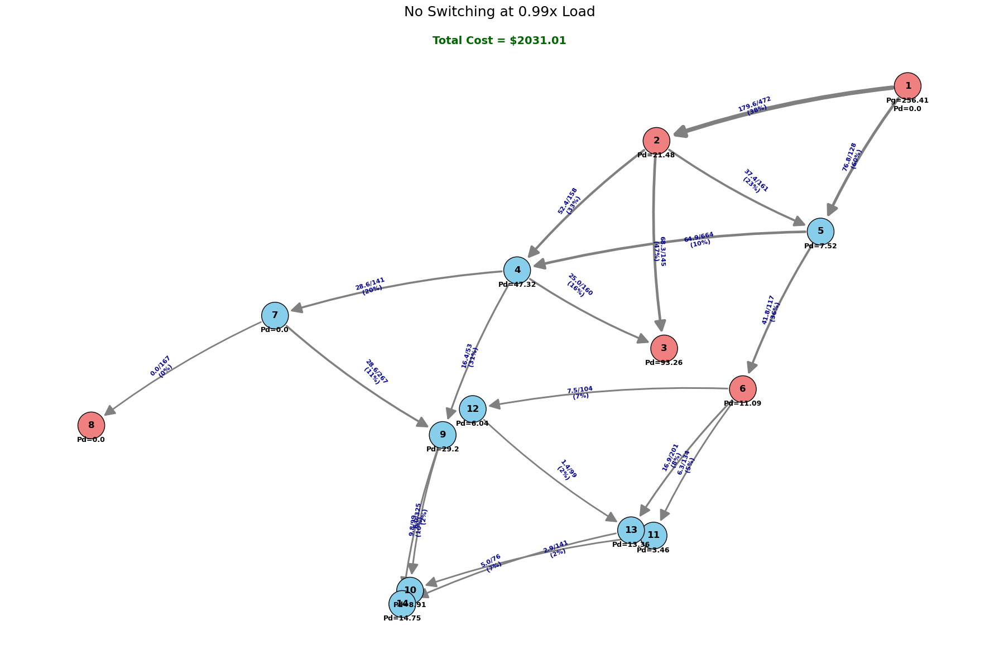

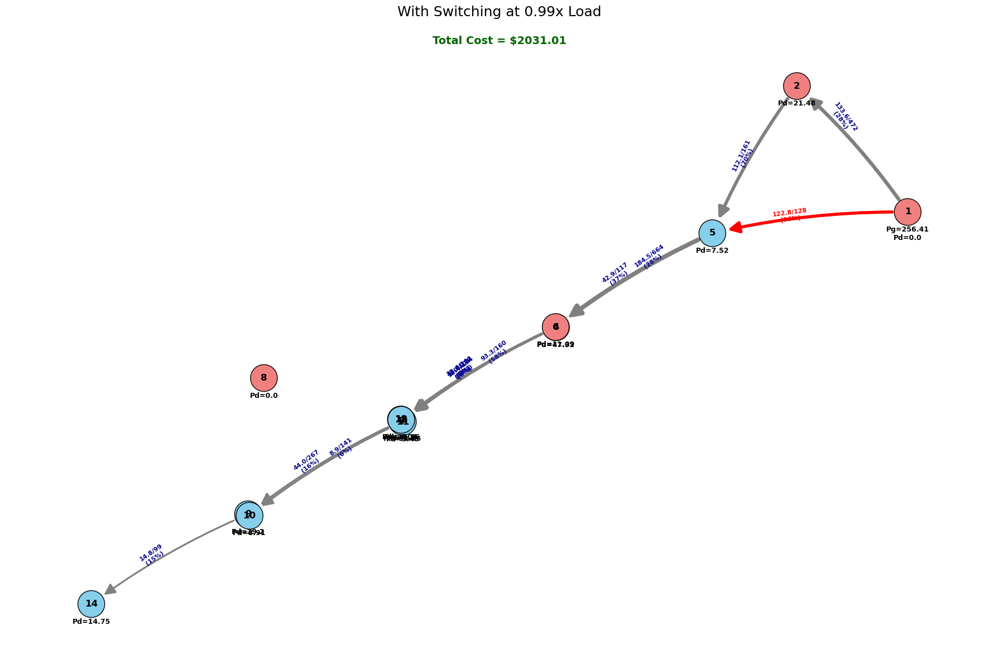


Processing scale 1.01...


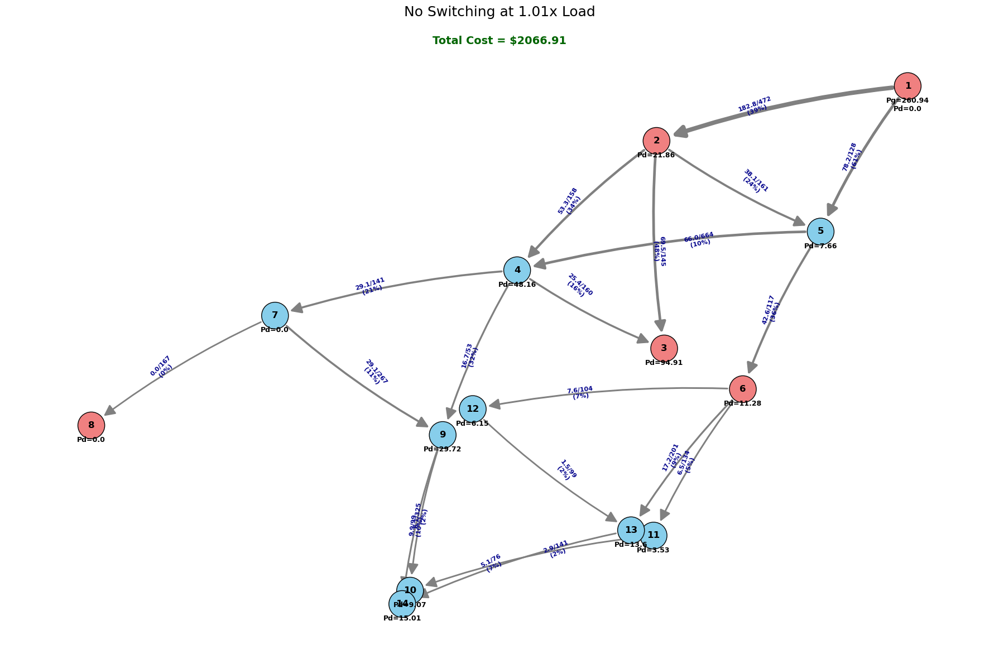

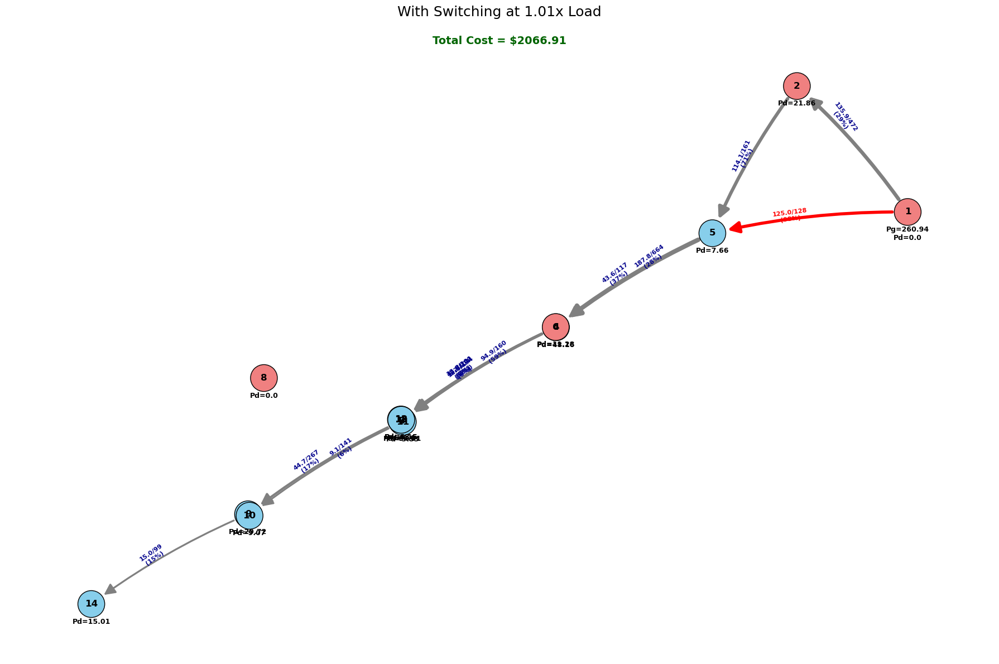


Processing scale 1.02...


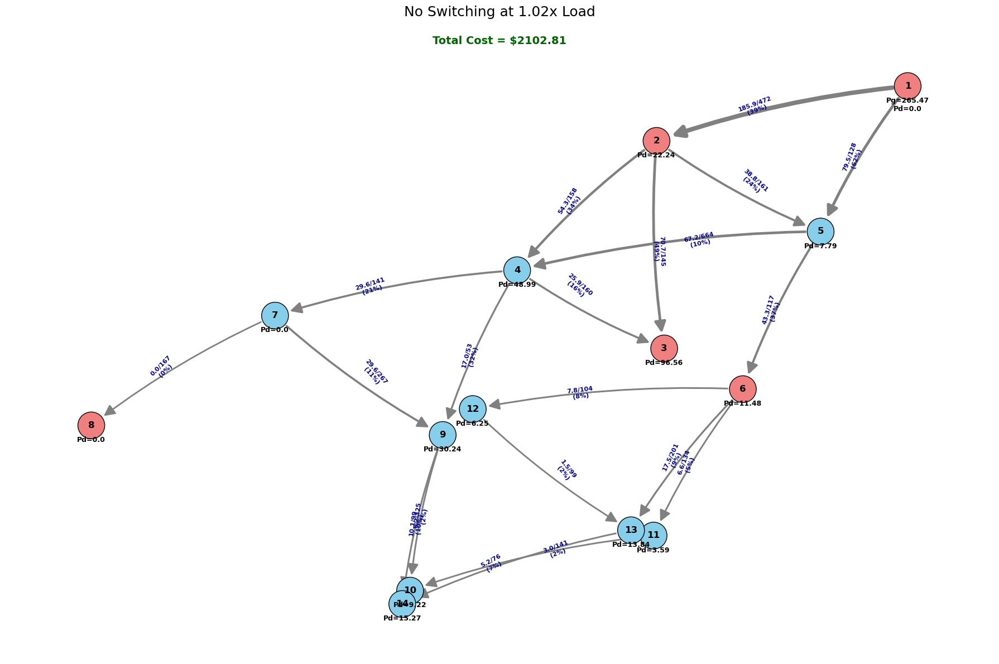

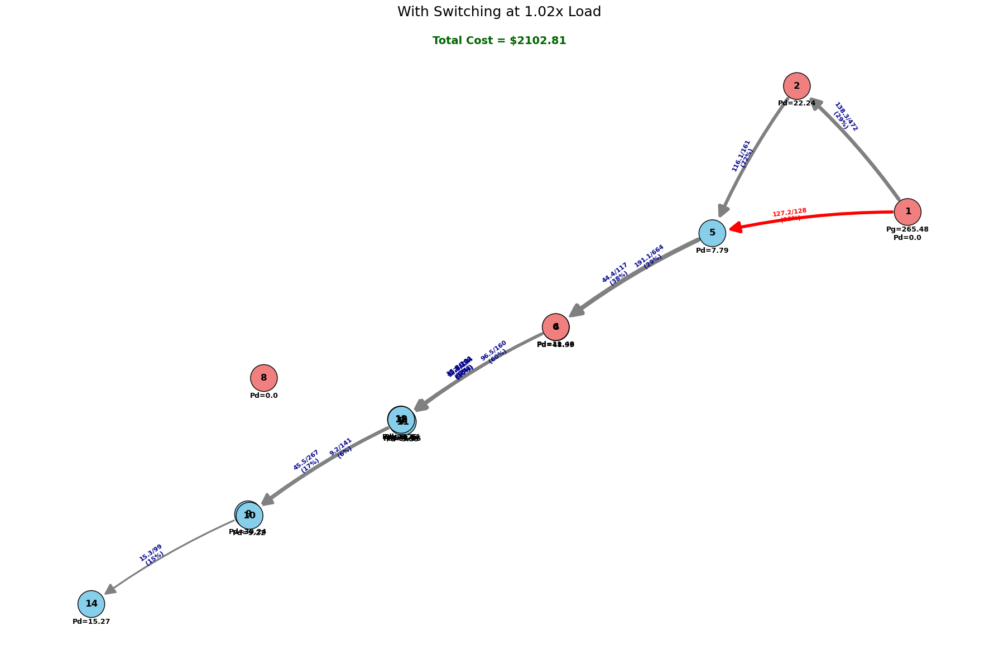


Processing scale 1.04...


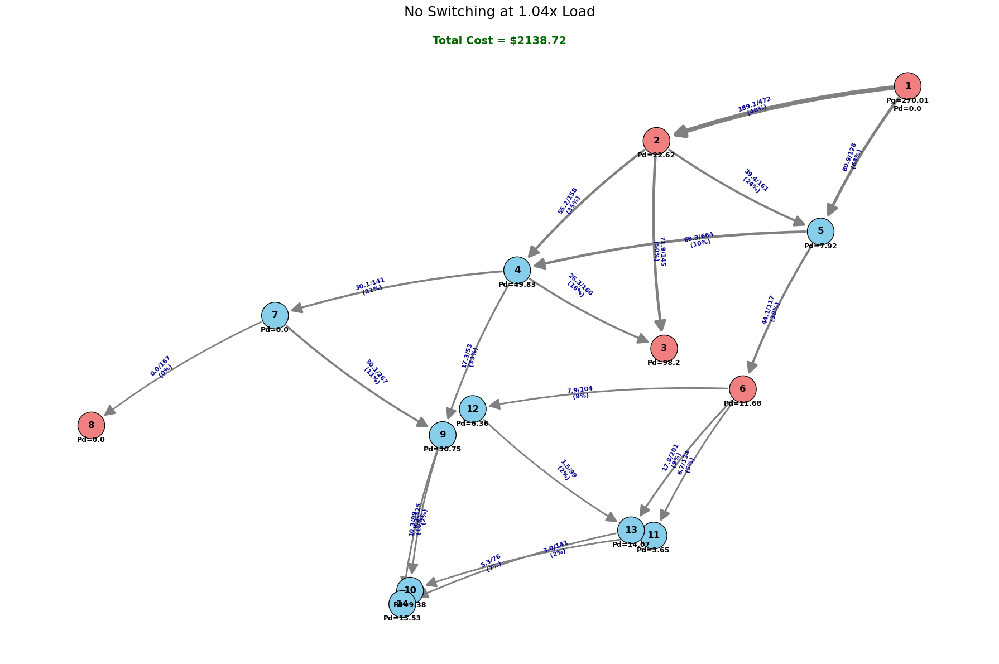

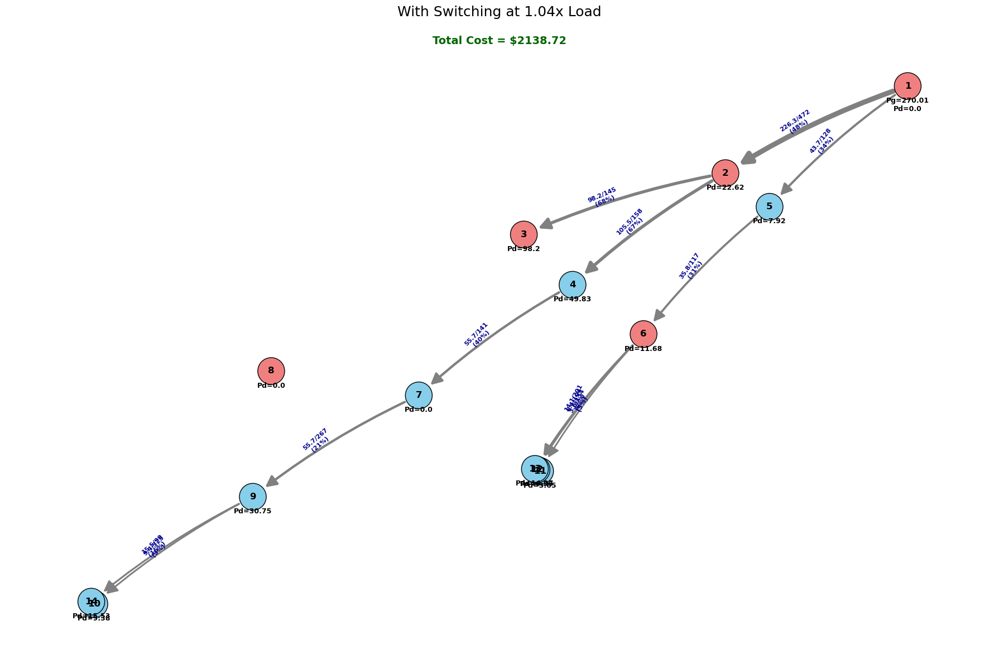


Processing scale 1.06...


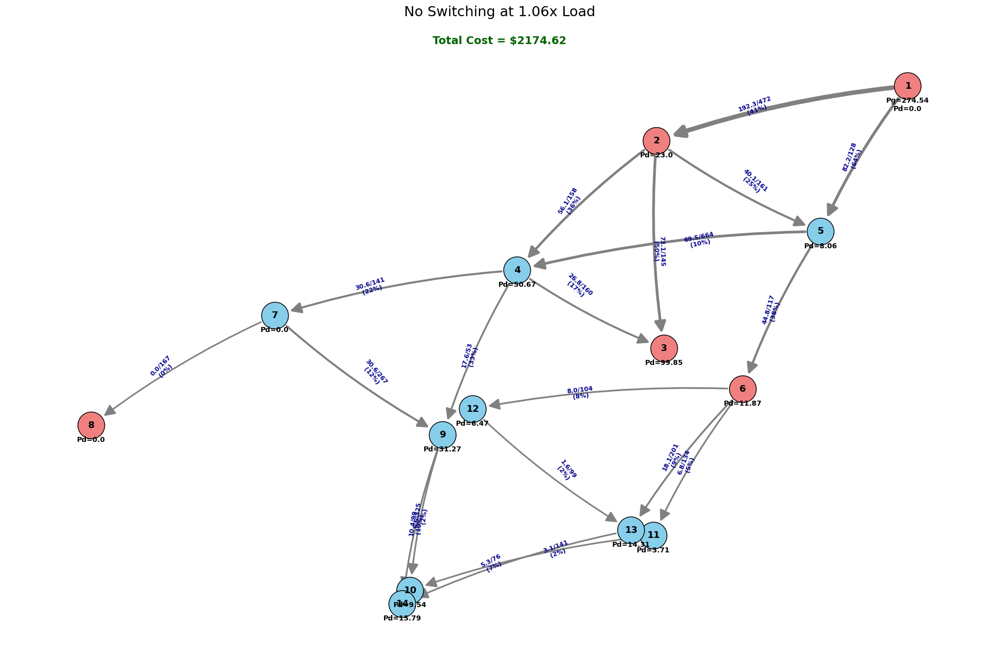

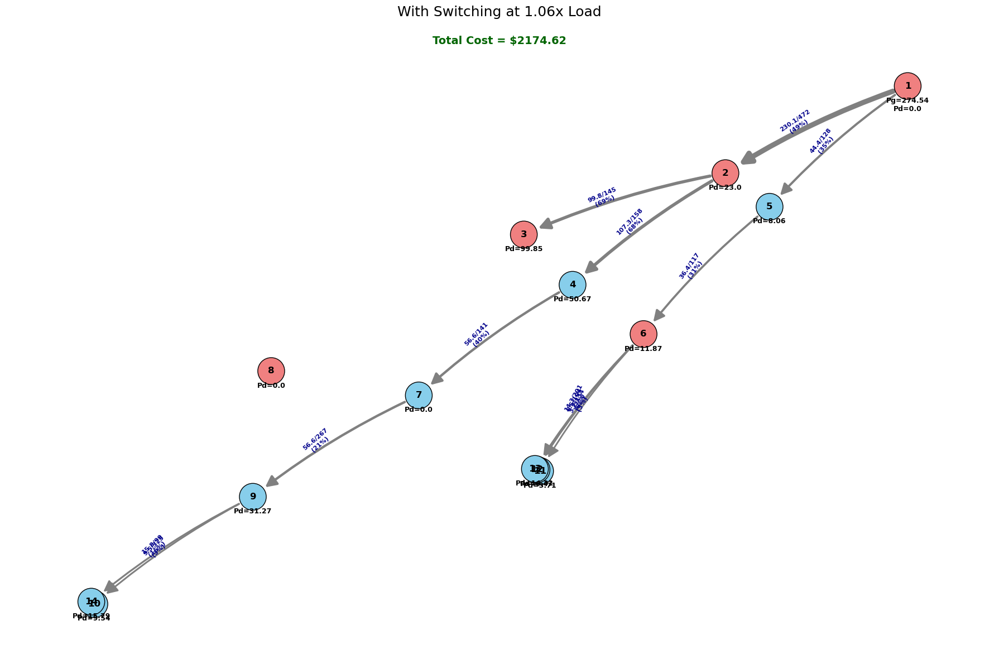


Processing scale 1.08...


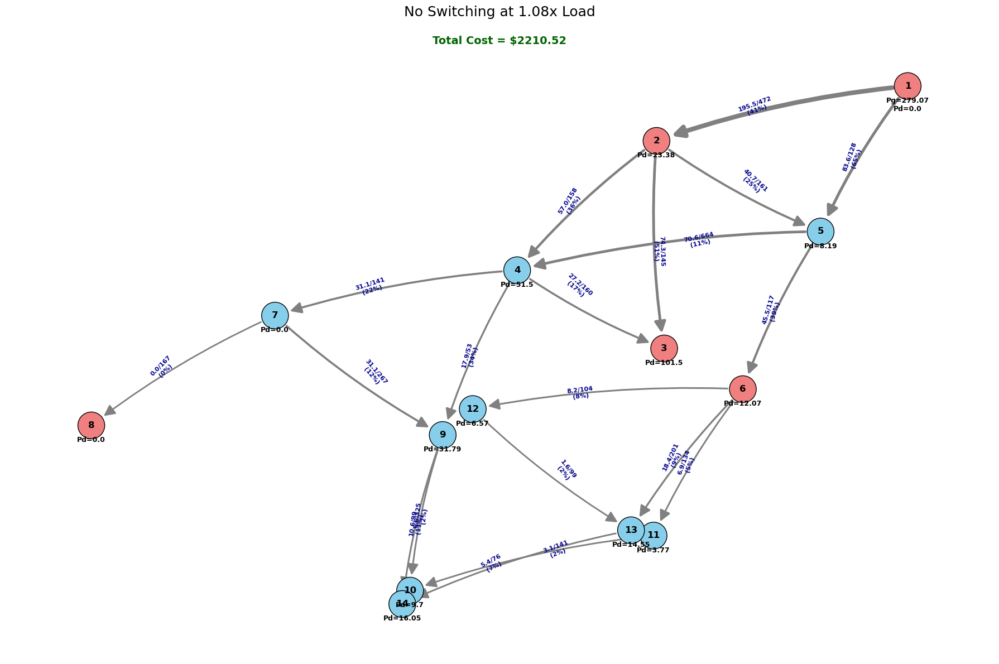

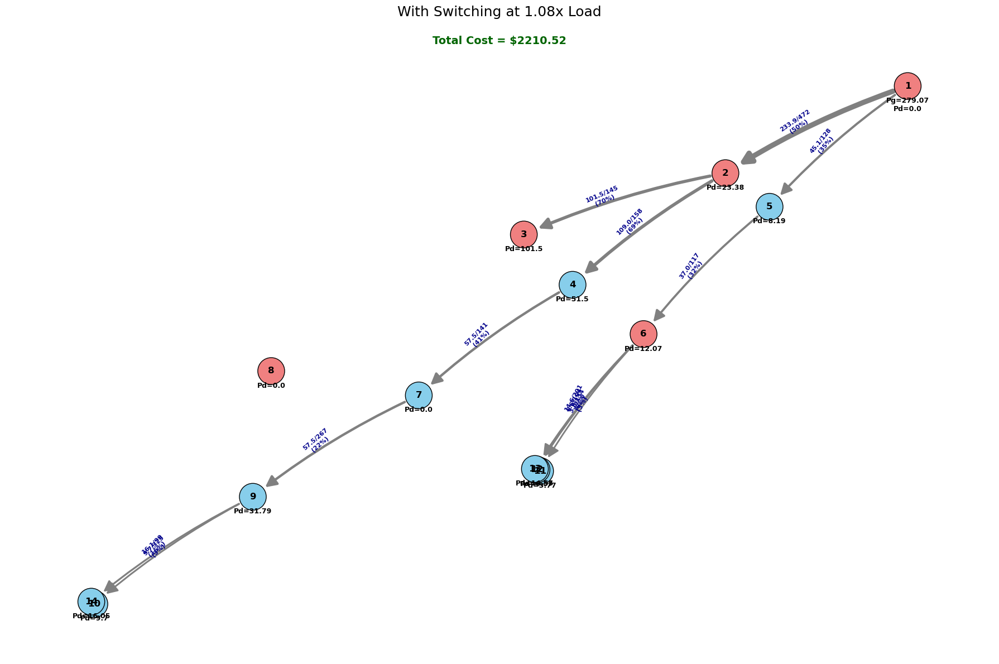


Processing scale 1.09...


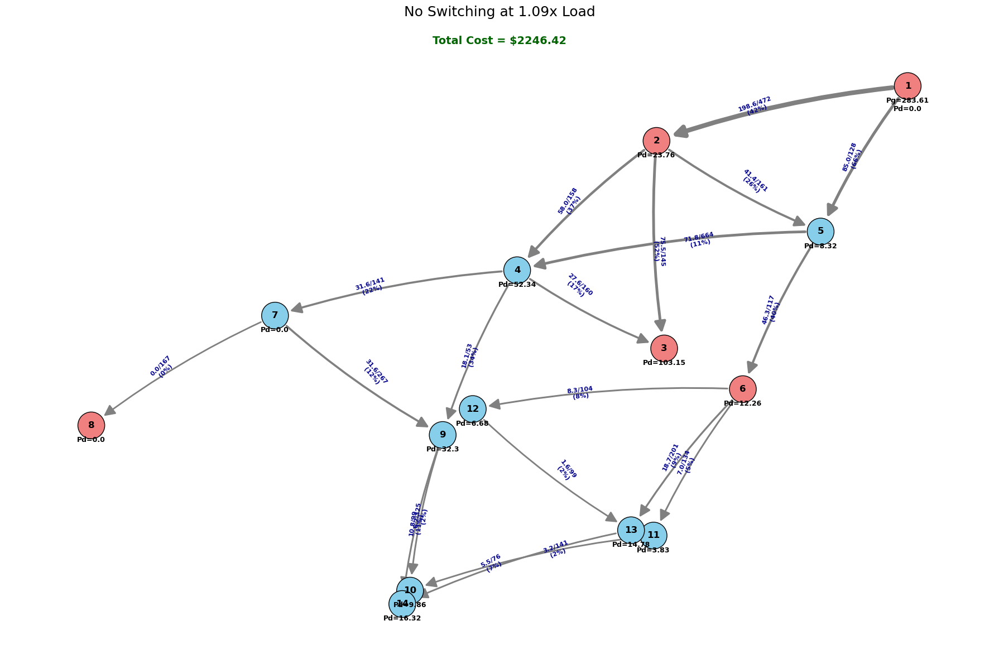

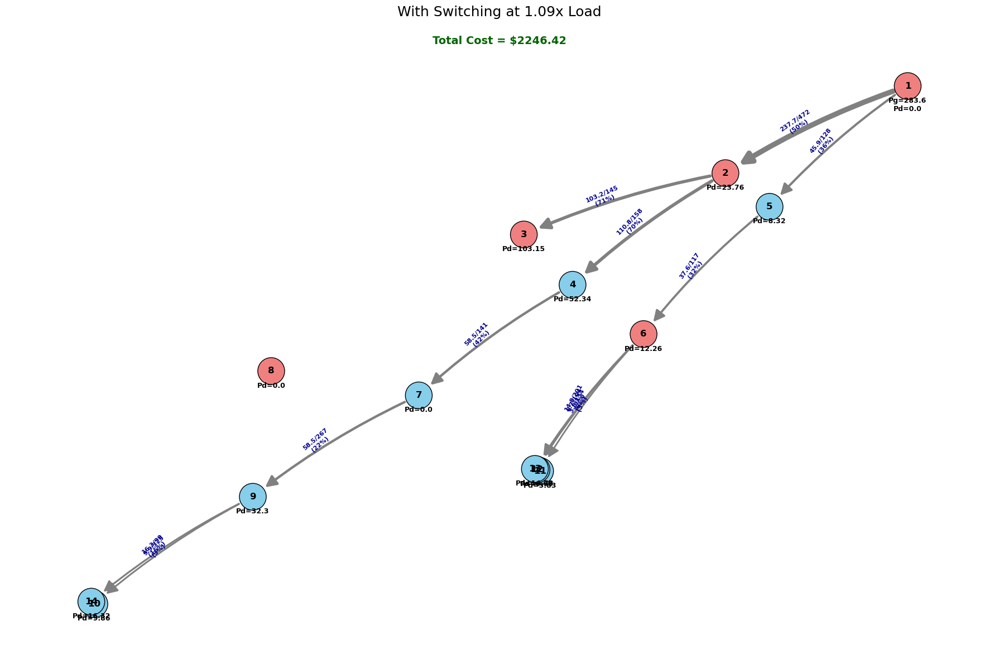


Processing scale 1.11...


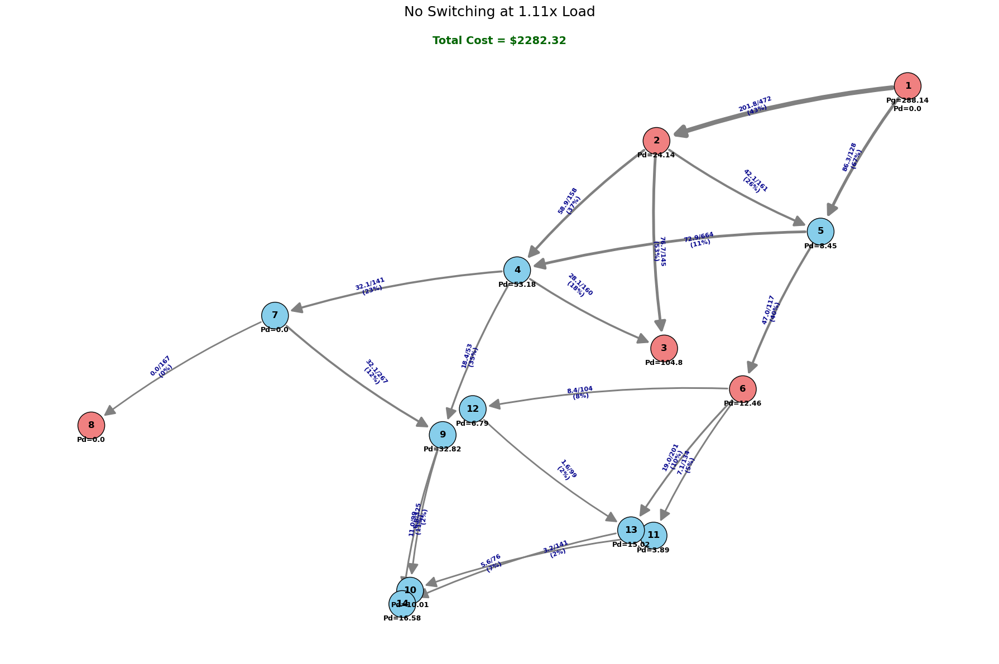

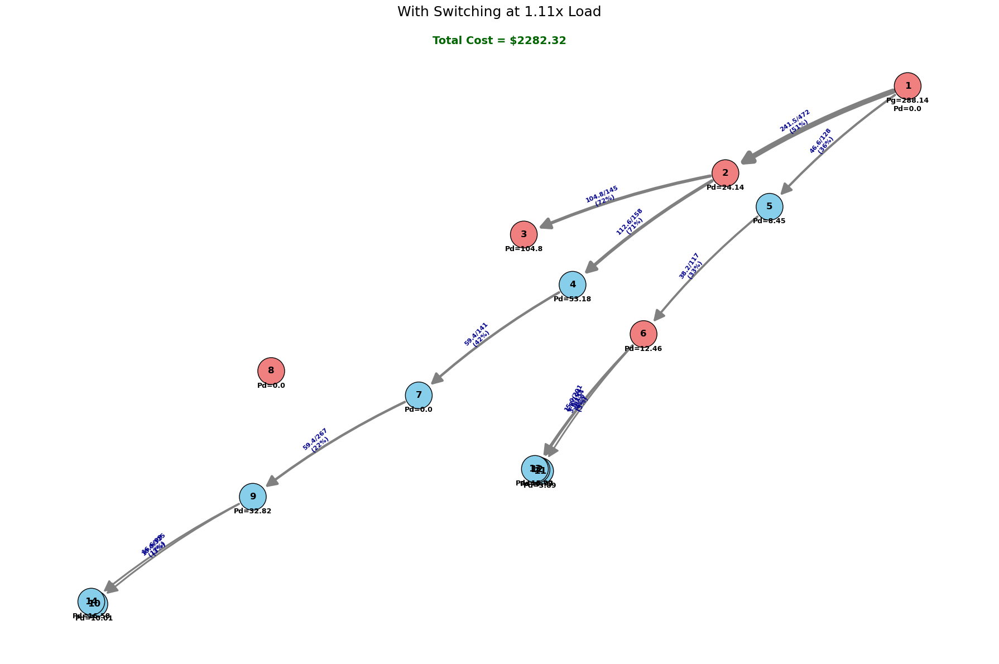


Processing scale 1.13...


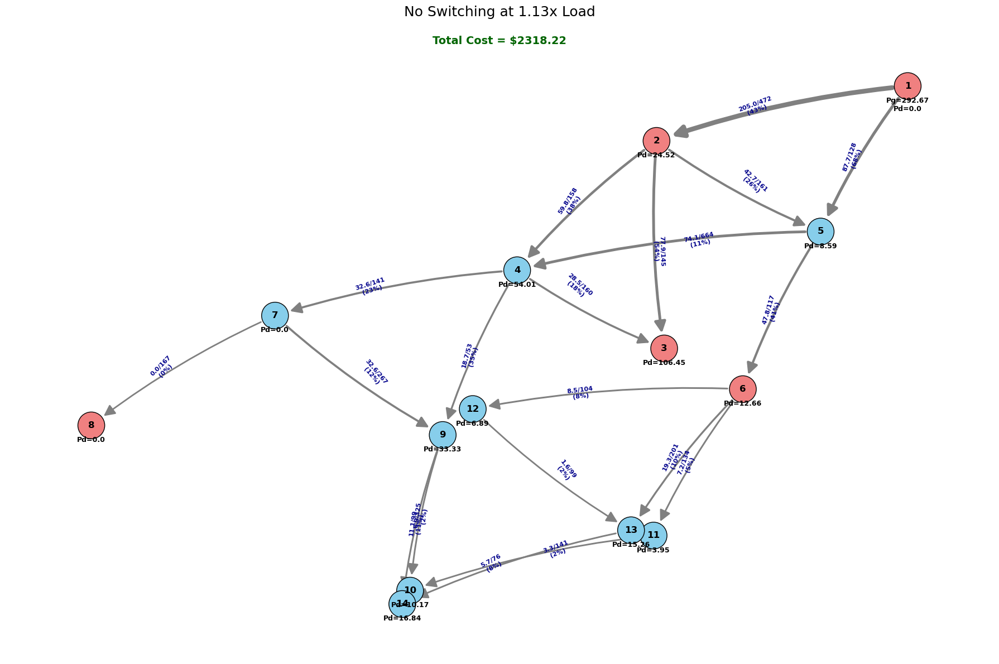

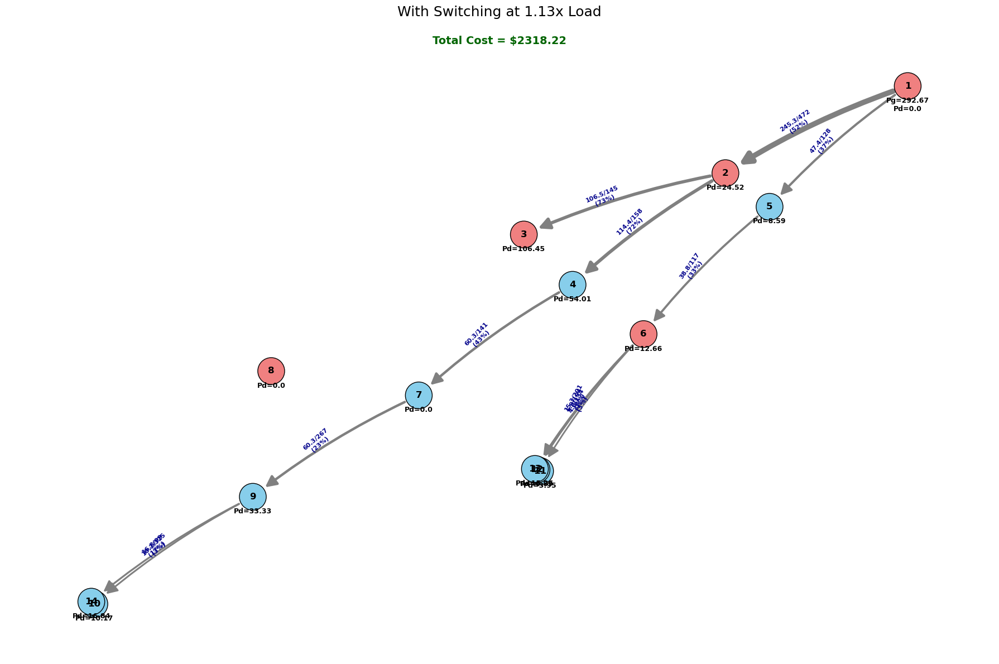


Processing scale 1.15...


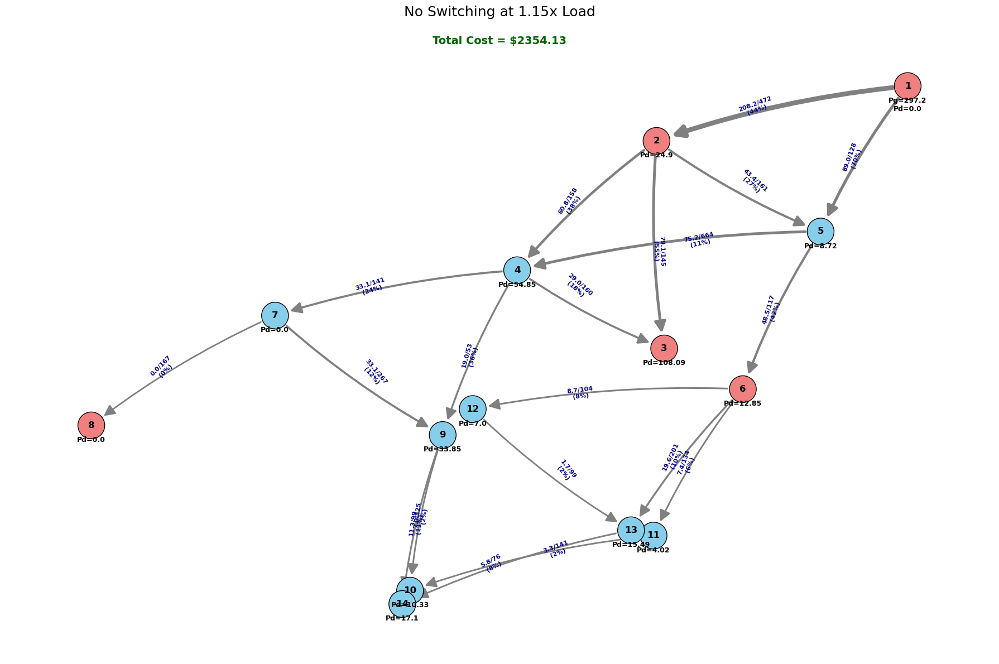

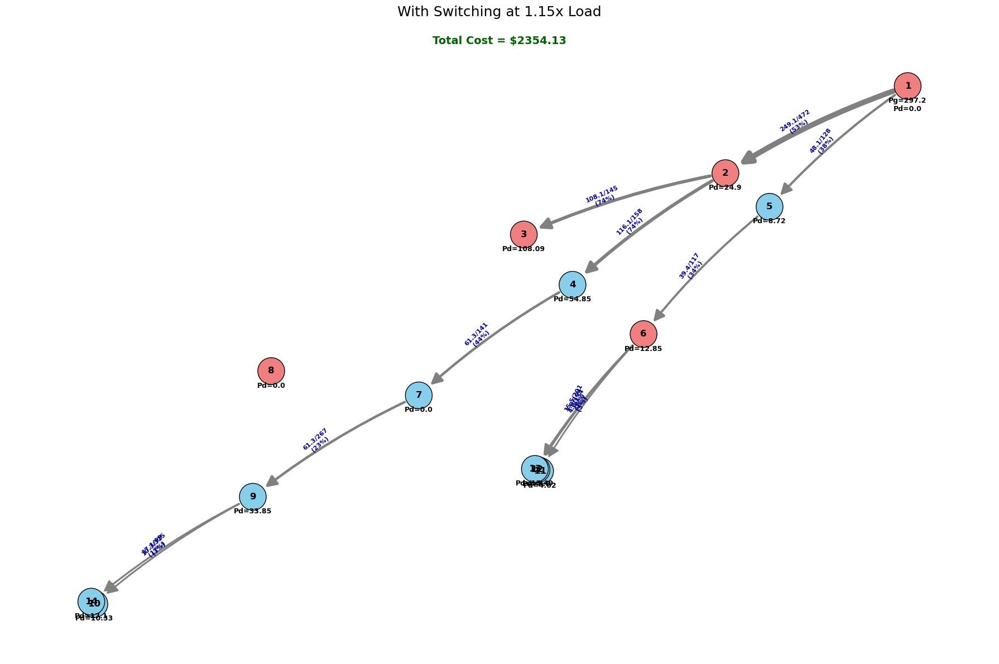


Processing scale 1.17...


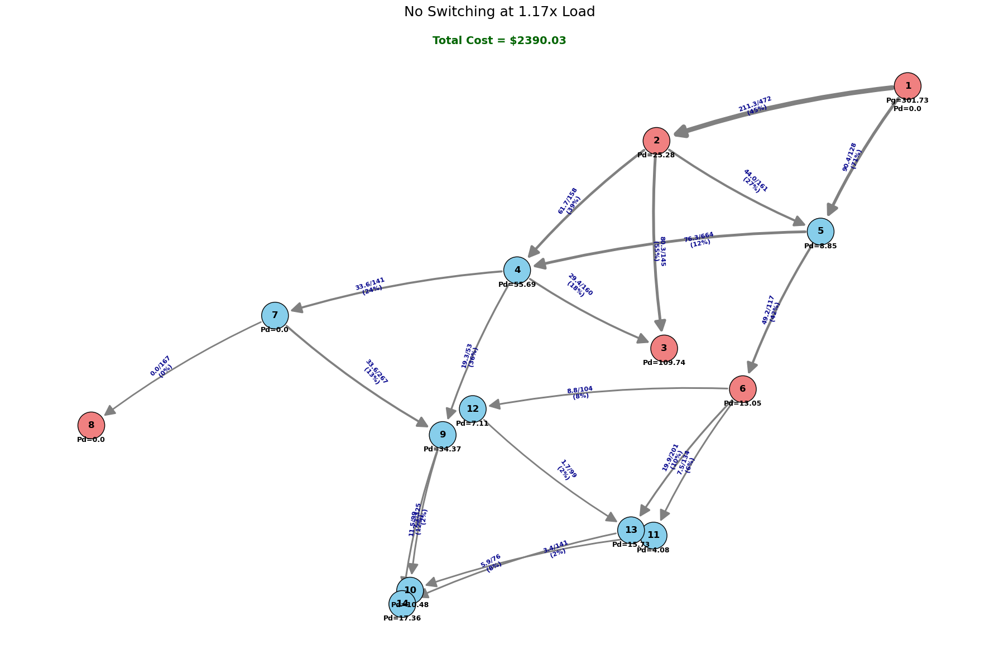

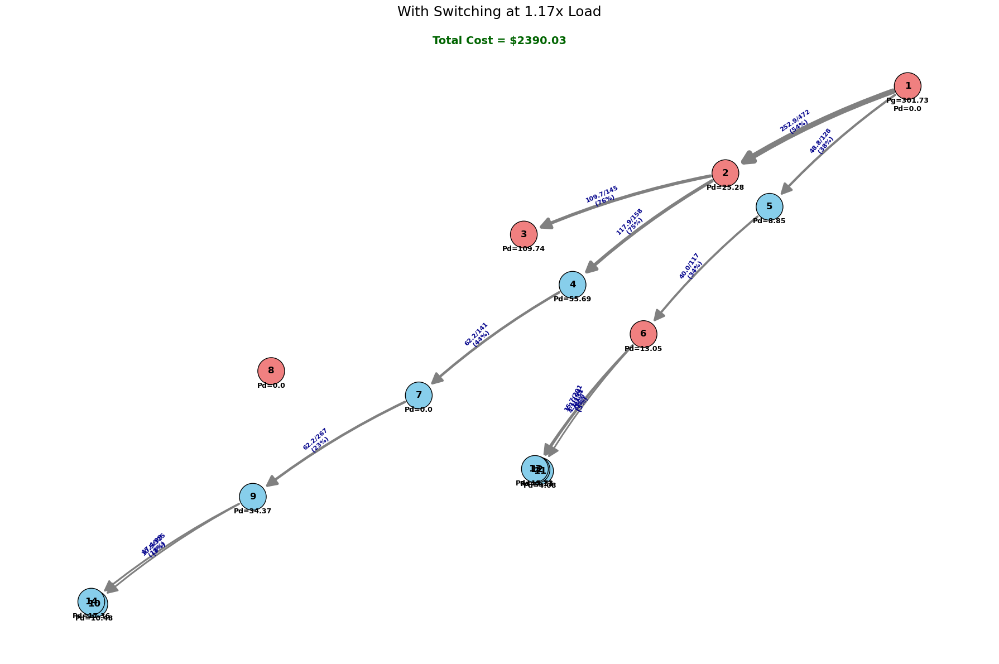


Processing scale 1.18...


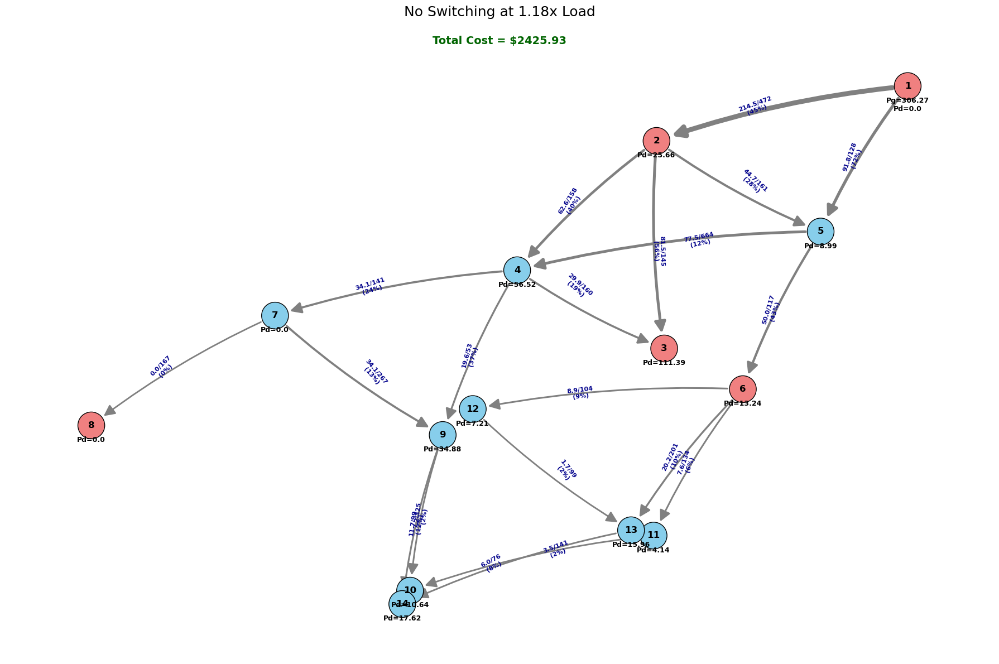

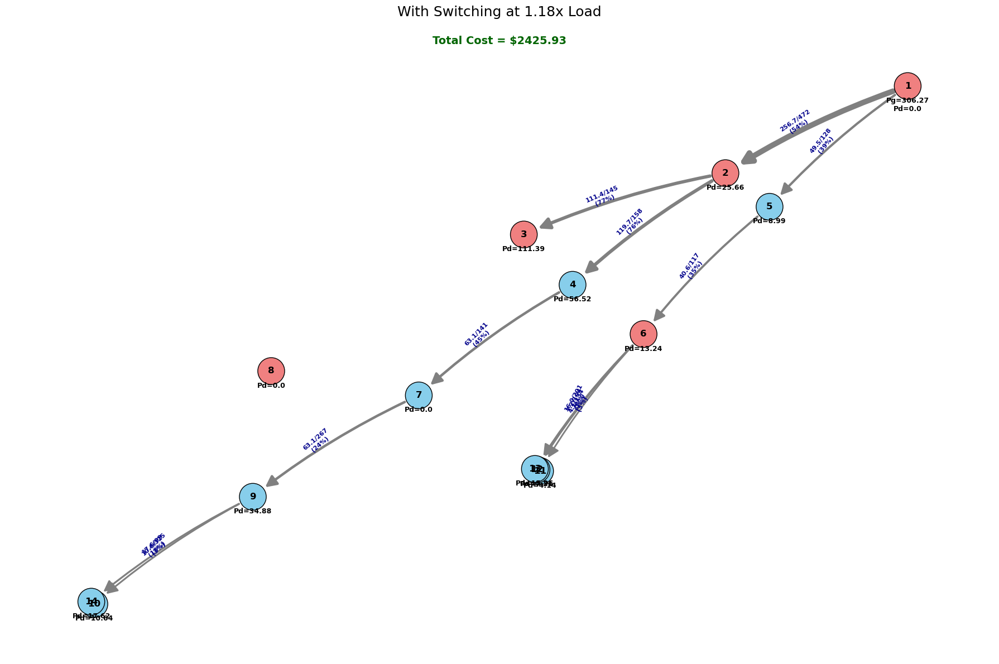


Processing scale 1.20...


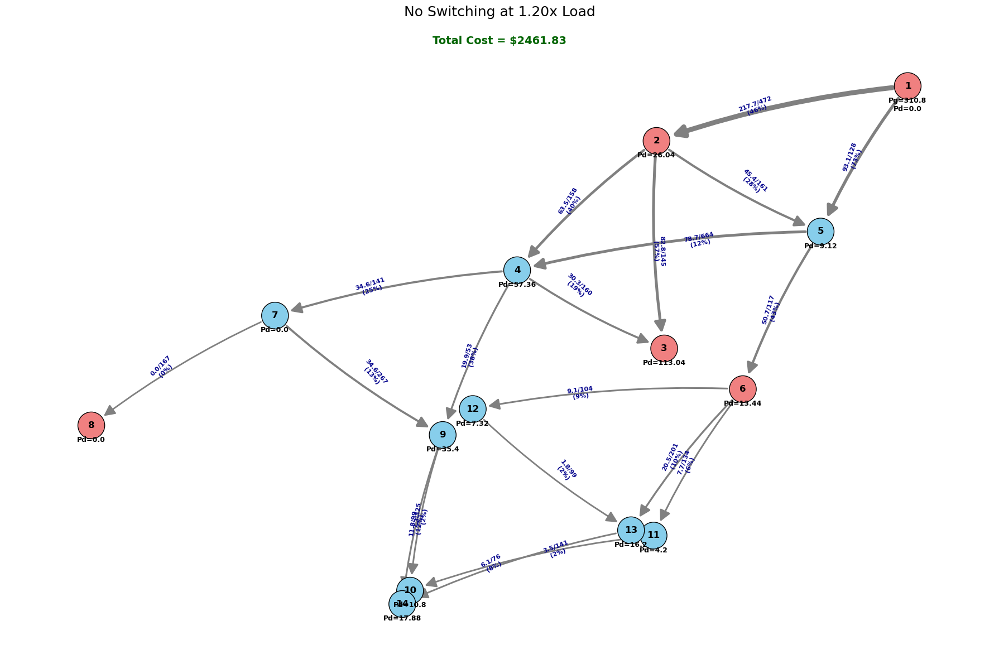

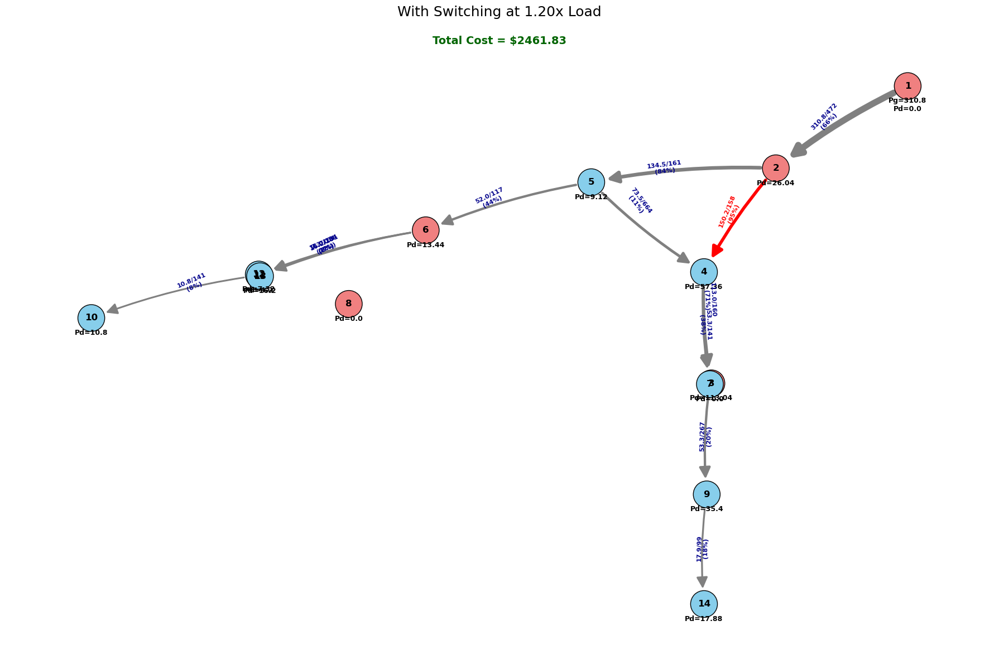


✓ All visualizations complete!


In [12]:
# %% [markdown]
# ## 9.3 Visualize All Load Scenarios

# %%
print("\n" + "="*60)
print("GENERATING VISUALIZATIONS FOR ALL LOAD SCENARIOS")
print("="*60)

scenarios = generate_load_scenarios(bus_df)

for scale, scenario_bus_df in scenarios:
    print(f"\nProcessing scale {scale:.2f}...")
    
    # Solve WITHOUT switching
    model_ns, results_ns = solve_dc_opf(
        scenario_bus_df, gen_df, branch_df, gencost_df, 
        switching=False, verbose=False
    )
    
    # Solve WITH switching
    model_sw, results_sw = solve_dc_opf(
        scenario_bus_df, gen_df, branch_df, gencost_df, 
        switching=True, verbose=False
    )
    
    if results_ns['status'] == 'optimal' and results_sw['status'] == 'optimal':
        # Analyze results
        bus_res_ns, branch_res_ns = analyze_results(
            results_ns, scenario_bus_df, gen_df, branch_df, gencost_df
        )
        bus_res_sw, branch_res_sw = analyze_results(
            results_sw, scenario_bus_df, gen_df, branch_df, gencost_df
        )
        
        # Visualize side-by-side
        visualize_opf_results(
            bus_res_ns, branch_res_ns, gen_df, 
            f"No Switching at {scale:.2f}x Load"
        )
        
        visualize_opf_results(
            bus_res_sw, branch_res_sw, gen_df, 
            f"With Switching at {scale:.2f}x Load"
        )
    else:
        print(f"  ⚠️  Scale {scale:.2f} is INFEASIBLE")

print("\n✓ All visualizations complete!")


Running load study (WITHOUT switching)...

Scale 0.85: Cost=$1743.80, Congested=0, Max Util=51.5%
Scale 0.87: Cost=$1779.70, Congested=0, Max Util=52.6%
Scale 0.89: Cost=$1815.60, Congested=0, Max Util=53.7%
Scale 0.90: Cost=$1851.50, Congested=0, Max Util=54.7%
Scale 0.92: Cost=$1887.40, Congested=0, Max Util=55.8%
Scale 0.94: Cost=$1923.31, Congested=0, Max Util=56.8%
Scale 0.95: Cost=$1959.21, Congested=0, Max Util=57.9%
Scale 0.97: Cost=$1995.11, Congested=0, Max Util=59.0%
Scale 0.99: Cost=$2031.01, Congested=0, Max Util=60.0%
Scale 1.01: Cost=$2066.91, Congested=0, Max Util=61.1%
Scale 1.02: Cost=$2102.81, Congested=0, Max Util=62.1%
Scale 1.04: Cost=$2138.72, Congested=0, Max Util=63.2%
Scale 1.06: Cost=$2174.62, Congested=0, Max Util=64.3%
Scale 1.08: Cost=$2210.52, Congested=0, Max Util=65.3%
Scale 1.09: Cost=$2246.42, Congested=0, Max Util=66.4%
Scale 1.11: Cost=$2282.32, Congested=0, Max Util=67.4%
Scale 1.13: Cost=$2318.22, Congested=0, Max Util=68.5%
Scale 1.15: Cost=$235

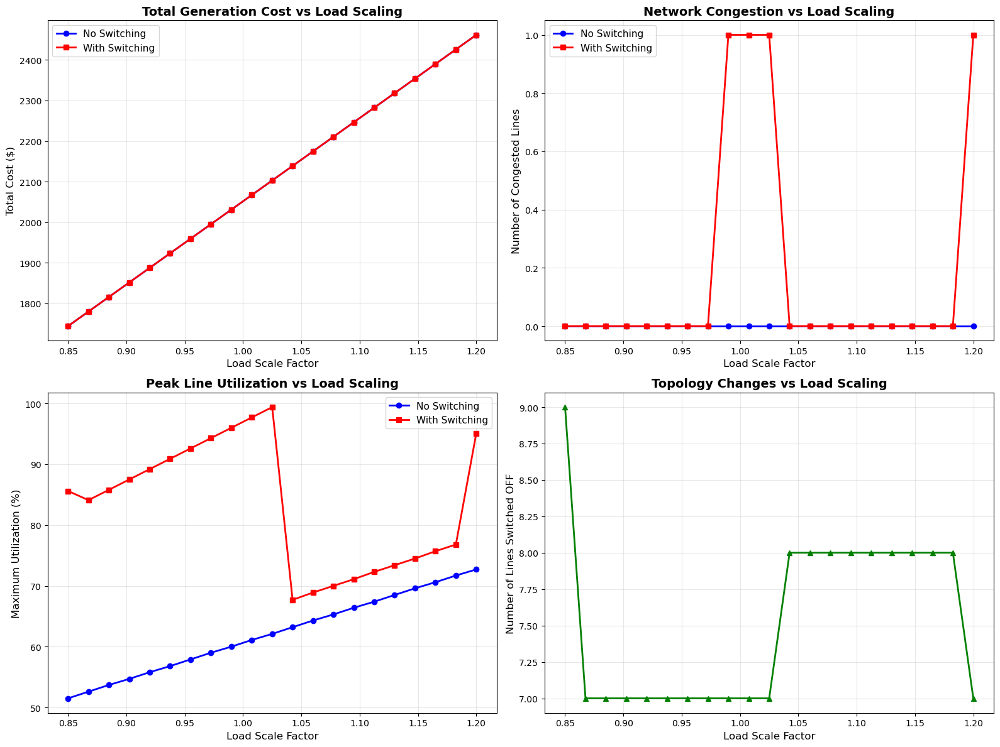


DETAILED ANALYSIS: Load Scale = 1.05

--- WITHOUT Switching ---
Cost: $2154.10
Congested Lines: 0
Max Utilization: 63.7%

--- WITH Switching ---
Cost: $2154.10
Congested Lines: 0
Max Utilization: 68.2%
Lines Switched OFF: 8

--- Congested Lines WITHOUT Switching ---
Empty DataFrame
Columns: [Line, From, To, Flow (MW), Limit (MW), Utilization (%)]
Index: []

--- Congested Lines WITH Switching ---
No congested lines with switching enabled!


In [7]:
# ### 9.1 Run Load Studies

# %%
study_no_switch = run_load_study(bus_df, gen_df, branch_df, gencost_df, switching=False)

# %%
study_with_switch = run_load_study(bus_df, gen_df, branch_df, gencost_df, switching=True)

# ### 9.2 Load Study Results Tables

# %%
print("\n--- Load Study WITHOUT Switching ---")
print(study_no_switch.to_string(index=False))

# %%
print("\n--- Load Study WITH Switching ---")
print(study_with_switch.to_string(index=False))

# ### 9.3 Comparative Visualizations

# Plot comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Cost comparison
ax1 = axes[0, 0]
ax1.plot(study_no_switch['scale'], study_no_switch['cost'], 'b-o', label='No Switching', linewidth=2, markersize=6)
ax1.plot(study_with_switch['scale'], study_with_switch['cost'], 'r-s', label='With Switching', linewidth=2, markersize=6)
ax1.set_xlabel('Load Scale Factor', fontsize=12)
ax1.set_ylabel('Total Cost ($)', fontsize=12)
ax1.set_title('Total Generation Cost vs Load Scaling', fontsize=14, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3)

# Congestion comparison
ax2 = axes[0, 1]
ax2.plot(study_no_switch['scale'], study_no_switch['num_congested'], 'b-o', label='No Switching', linewidth=2, markersize=6)
ax2.plot(study_with_switch['scale'], study_with_switch['num_congested'], 'r-s', label='With Switching', linewidth=2, markersize=6)
ax2.set_xlabel('Load Scale Factor', fontsize=12)
ax2.set_ylabel('Number of Congested Lines', fontsize=12)
ax2.set_title('Network Congestion vs Load Scaling', fontsize=14, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

# Max utilization comparison
ax3 = axes[1, 0]
ax3.plot(study_no_switch['scale'], study_no_switch['max_utilization'], 'b-o', label='No Switching', linewidth=2, markersize=6)
ax3.plot(study_with_switch['scale'], study_with_switch['max_utilization'], 'r-s', label='With Switching', linewidth=2, markersize=6)
ax3.set_xlabel('Load Scale Factor', fontsize=12)
ax3.set_ylabel('Maximum Utilization (%)', fontsize=12)
ax3.set_title('Peak Line Utilization vs Load Scaling', fontsize=14, fontweight='bold')
ax3.legend(fontsize=11)
ax3.grid(True, alpha=0.3)

# Number of lines switched off
ax4 = axes[1, 1]
if 'num_lines_off' in study_with_switch.columns:
    ax4.plot(study_with_switch['scale'], study_with_switch['num_lines_off'], 'g-^', linewidth=2, markersize=6)
    ax4.set_xlabel('Load Scale Factor', fontsize=12)
    ax4.set_ylabel('Number of Lines Switched OFF', fontsize=12)
    ax4.set_title('Topology Changes vs Load Scaling', fontsize=14, fontweight='bold')
    ax4.grid(True, alpha=0.3)
else:
    ax4.text(0.5, 0.5, 'No switching data available', 
             ha='center', va='center', fontsize=12, transform=ax4.transAxes)

plt.tight_layout()
plt.show()

# ## 10. Detailed Analysis for Specific Load Cases

# %%
# Analyze a high-load scenario in detail
high_load_scale = 1.05
print(f"\n{'='*60}")
print(f"DETAILED ANALYSIS: Load Scale = {high_load_scale}")
print(f"{'='*60}\n")

# Create scaled load scenario
scenario_bus_df = bus_df.copy()
scenario_bus_df['Pd'] = bus_df['Pd'] * high_load_scale
scenario_bus_df['Qd'] = bus_df['Qd'] * high_load_scale

# Solve without switching
model_hl, results_hl = solve_dc_opf(scenario_bus_df, gen_df, branch_df, gencost_df, switching=False, verbose=False)
bus_res_hl, branch_res_hl = analyze_results(results_hl, scenario_bus_df, gen_df, branch_df, gencost_df)

# Solve with switching
model_hl_sw, results_hl_sw = solve_dc_opf(scenario_bus_df, gen_df, branch_df, gencost_df, switching=True, verbose=False)
bus_res_hl_sw, branch_res_hl_sw = analyze_results(results_hl_sw, scenario_bus_df, gen_df, branch_df, gencost_df)

print("--- WITHOUT Switching ---")
print(f"Cost: ${results_hl['obj_value']:.2f}")
print(f"Congested Lines: {branch_res_hl['Congested'].sum()}")
print(f"Max Utilization: {branch_res_hl['Utilization (%)'].max():.1f}%")

print("\n--- WITH Switching ---")
print(f"Cost: ${results_hl_sw['obj_value']:.2f}")
print(f"Congested Lines: {branch_res_hl_sw['Congested'].sum()}")
print(f"Max Utilization: {branch_res_hl_sw['Utilization (%)'].max():.1f}%")
print(f"Lines Switched OFF: {(branch_res_hl_sw['Status'] == 'OFF').sum()}")

print("\n--- Congested Lines WITHOUT Switching ---")
print(branch_res_hl[branch_res_hl['Congested']][['Line', 'From', 'To', 'Flow (MW)', 'Limit (MW)', 'Utilization (%)']])

print("\n--- Congested Lines WITH Switching ---")
congested_with_sw = branch_res_hl_sw[branch_res_hl_sw['Congested']]
if len(congested_with_sw) > 0:
    print(congested_with_sw[['Line', 'From', 'To', 'Flow (MW)', 'Limit (MW)', 'Utilization (%)', 'Status']])
else:
    print("No congested lines with switching enabled!")


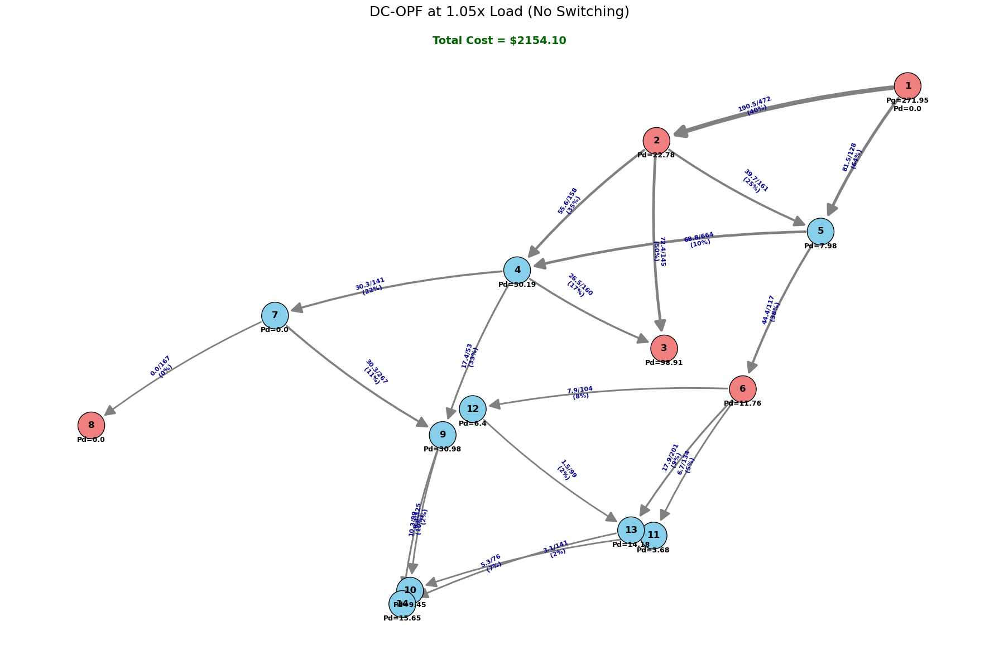

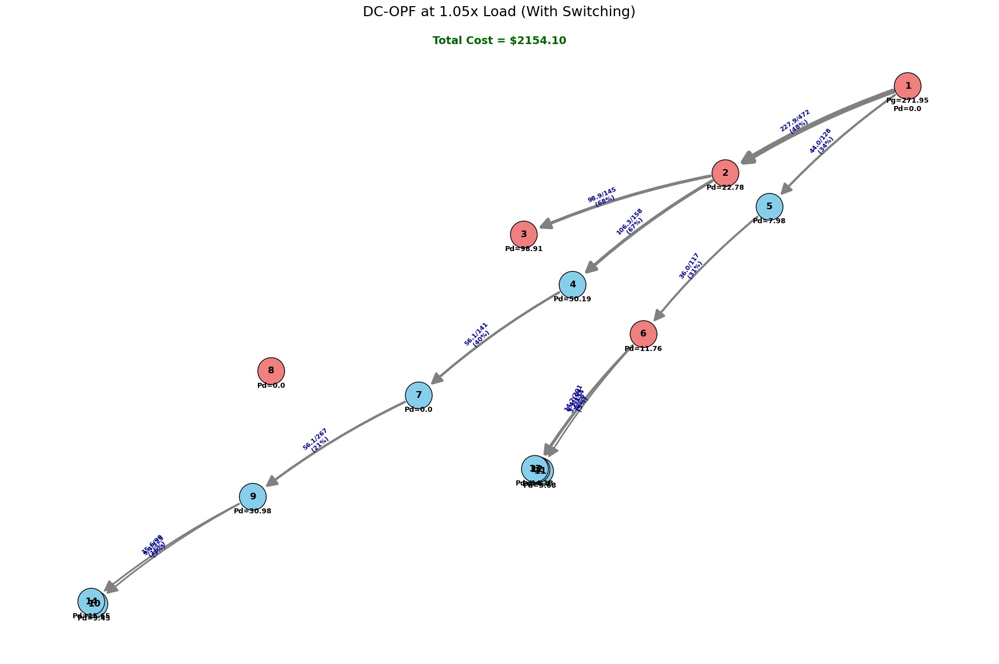


--- Topology Comparison ---
    Line  From  To  Flow (MW)_NoSw  Utilization (%)_NoSw  Flow (MW)_WithSw  Utilization (%)_WithSw Status  Flow_Diff  Util_Diff
6      6     4   5          -68.82                  10.4              0.00                     0.0    OFF      68.82      -10.4
3      3     2   4           55.58                  35.2            106.26                    67.3     ON      50.68       32.1
4      4     2   5           39.70                  24.7              0.00                     0.0    OFF     -39.70      -24.7
1      1     1   5           81.48                  63.7             43.99                    34.4     ON     -37.49      -29.3
0      0     1   2          190.47                  40.4            227.95                    48.3     ON      37.48        7.9
5      5     3   4          -26.51                  16.6              0.00                     0.0    OFF      26.51      -16.6
2      2     2   3           72.40                  49.9             98.91 

In [8]:
# ### 10.1 Visualization: High Load Without Switching

# %%
visualize_opf_results(bus_res_hl, branch_res_hl, gen_df, f"DC-OPF at {high_load_scale}x Load (No Switching)")

# ### 10.2 Visualization: High Load With Switching

# %%
visualize_opf_results(bus_res_hl_sw, branch_res_hl_sw, gen_df, f"DC-OPF at {high_load_scale}x Load (With Switching)")

# ### 10.3 Switching Impact Analysis

# %%
# Compare specific lines that changed
print("\n--- Topology Comparison ---")
comparison = pd.merge(
    branch_res_hl[['Line', 'From', 'To', 'Flow (MW)', 'Utilization (%)']],
    branch_res_hl_sw[['Line', 'Flow (MW)', 'Utilization (%)', 'Status']],
    on='Line',
    suffixes=('_NoSw', '_WithSw')
)

comparison['Flow_Diff'] = comparison['Flow (MW)_WithSw'] - comparison['Flow (MW)_NoSw']
comparison['Util_Diff'] = comparison['Utilization (%)_WithSw'] - comparison['Utilization (%)_NoSw']

# Show lines that were switched off or had significant flow changes
significant = comparison[(comparison['Status'] == 'OFF') | (abs(comparison['Flow_Diff']) > 5)]
print(significant.sort_values('Flow_Diff', key=abs, ascending=False))


In [9]:
# ## 11. Comprehensive Load Study Analysis

# 
# Merge the two studies for easier comparison
study_comparison = pd.merge(
    study_no_switch[['scale', 'cost', 'num_congested', 'max_utilization']],
    study_with_switch[['scale', 'cost', 'num_congested', 'max_utilization', 'num_lines_off']],
    on='scale',
    suffixes=('_NoSw', '_WithSw')
)

study_comparison['cost_savings'] = study_comparison['cost_NoSw'] - study_comparison['cost_WithSw']
study_comparison['cost_savings_pct'] = (study_comparison['cost_savings'] / study_comparison['cost_NoSw'] * 100)
study_comparison['congestion_reduction'] = study_comparison['num_congested_NoSw'] - study_comparison['num_congested_WithSw']

print("\n--- Load Study Summary ---")
print(study_comparison[['scale', 'cost_NoSw', 'cost_WithSw', 'cost_savings', 'cost_savings_pct', 
                         'num_congested_NoSw', 'num_congested_WithSw', 'congestion_reduction', 
                         'num_lines_off']].to_string(index=False))

# ### 11.1 Key Insights

# %%
print("\n" + "="*60)
print("KEY INSIGHTS FROM LOAD STUDY")
print("="*60)

# Find when congestion first appears
first_congestion_nosw = study_no_switch[study_no_switch['num_congested'] > 0]['scale'].min()
first_congestion_withsw = study_with_switch[study_with_switch['num_congested'] > 0]['scale'].min()

print(f"\n1. Congestion Onset:")
print(f"   - Without switching: {first_congestion_nosw:.2f}x load")
print(f"   - With switching: {first_congestion_withsw:.2f}x load")

# Average cost savings
avg_savings = study_comparison['cost_savings'].mean()
avg_savings_pct = study_comparison['cost_savings_pct'].mean()

print(f"\n2. Economic Benefits:")
print(f"   - Average cost savings: ${avg_savings:.2f} ({avg_savings_pct:.2f}%)")
print(f"   - Max cost savings: ${study_comparison['cost_savings'].max():.2f} at {study_comparison.loc[study_comparison['cost_savings'].idxmax(), 'scale']:.2f}x load")

# Congestion reduction
avg_congestion_reduction = study_comparison['congestion_reduction'].mean()
max_congestion_reduction = study_comparison['congestion_reduction'].max()

print(f"\n3. Congestion Relief:")
print(f"   - Average reduction: {avg_congestion_reduction:.1f} lines")
print(f"   - Max reduction: {max_congestion_reduction:.0f} lines at {study_comparison.loc[study_comparison['congestion_reduction'].idxmax(), 'scale']:.2f}x load")

# Switching behavior
if 'num_lines_off' in study_with_switch.columns:
    avg_lines_off = study_with_switch['num_lines_off'].mean()
    max_lines_off = study_with_switch['num_lines_off'].max()
    
    print(f"\n4. Switching Behavior:")
    print(f"   - Average lines switched off: {avg_lines_off:.1f}")
    print(f"   - Max lines switched off: {max_lines_off:.0f} at {study_with_switch.loc[study_with_switch['num_lines_off'].idxmax(), 'scale']:.2f}x load")



--- Load Study Summary ---
 scale   cost_NoSw  cost_WithSw  cost_savings  cost_savings_pct  num_congested_NoSw  num_congested_WithSw  congestion_reduction  num_lines_off
0.8500 1743.797363  1743.797363  2.592060e-11      1.486446e-12                   0                     0                     0              9
0.8675 1779.699073  1779.699073  4.547474e-13      2.555192e-14                   0                     0                     0              7
0.8850 1815.600783  1815.600783  0.000000e+00      0.000000e+00                   0                     0                     0              7
0.9025 1851.502494  1851.502494 -1.364242e-12     -7.368297e-14                   0                     0                     0              7
0.9200 1887.404204  1887.404204 -6.821210e-13     -3.614070e-14                   0                     0                     0              7
0.9375 1923.305915  1923.305915 -1.364242e-12     -7.093214e-14                   0                     0         

In [10]:
# ## 12. Identify Critical Lines for Switching

# %%
print("\n" + "="*60)
print("CRITICAL LINE ANALYSIS")
print("="*60)

# Analyze which lines are most frequently switched across all scenarios
line_switching_summary = []

for scale_val in study_with_switch['scale'].values:
    scenario_bus_df = bus_df.copy()
    scenario_bus_df['Pd'] = bus_df['Pd'] * scale_val
    scenario_bus_df['Qd'] = bus_df['Qd'] * scale_val
    
    _, results_temp = solve_dc_opf(scenario_bus_df, gen_df, branch_df, gencost_df, switching=True, verbose=False)
    
    if results_temp['status'] == 'optimal' and 'z' in results_temp:
        for line_idx, z_val in results_temp['z'].items():
            line_switching_summary.append({
                'scale': scale_val,
                'line': line_idx,
                'from': int(branch_df.loc[line_idx, 'fbus']),
                'to': int(branch_df.loc[line_idx, 'tbus']),
                'status': 'ON' if z_val > 0.5 else 'OFF'
            })

switching_df = pd.DataFrame(line_switching_summary)

# Count how often each line is switched off
line_off_counts = switching_df[switching_df['status'] == 'OFF'].groupby(['line', 'from', 'to']).size().reset_index(name='times_off')
line_off_counts = line_off_counts.sort_values('times_off', ascending=False)

print("\n--- Lines Most Frequently Switched OFF ---")
print(line_off_counts.head(10))

# ## 13. Side-by-Side Comparison for Selected Load Scenario

# %%
# Pick an interesting load scenario (e.g., where switching has most impact)
target_scale = study_comparison.loc[study_comparison['cost_savings'].idxmax(), 'scale']

print(f"\n{'='*60}")
print(f"SIDE-BY-SIDE COMPARISON AT {target_scale:.2f}x LOAD")
print(f"{'='*60}\n")

scenario_bus_df = bus_df.copy()
scenario_bus_df['Pd'] = bus_df['Pd'] * target_scale
scenario_bus_df['Qd'] = bus_df['Qd'] * target_scale

# Without switching
_, res_nosw = solve_dc_opf(scenario_bus_df, gen_df, branch_df, gencost_df, switching=False, verbose=False)
bus_nosw, branch_nosw = analyze_results(res_nosw, scenario_bus_df, gen_df, branch_df, gencost_df)

# With switching
_, res_withsw = solve_dc_opf(scenario_bus_df, gen_df, branch_df, gencost_df, switching=True, verbose=False)
bus_withsw, branch_withsw = analyze_results(res_withsw, scenario_bus_df, gen_df, branch_df, gencost_df)

print(f"WITHOUT Switching: Cost = ${res_nosw['obj_value']:.2f}, Congested = {branch_nosw['Congested'].sum()}")
print(f"WITH Switching:    Cost = ${res_withsw['obj_value']:.2f}, Congested = {branch_withsw['Congested'].sum()}")
print(f"Improvement:       Cost savings = ${res_nosw['obj_value'] - res_withsw['obj_value']:.2f} ({(1 - res_withsw['obj_value']/res_nosw['obj_value'])*100:.2f}%)")



CRITICAL LINE ANALYSIS

--- Lines Most Frequently Switched OFF ---
    line  from  to  times_off
8     13     7   8         21
12    18    12  13         21
13    19    13  14         21
7      8     4   9         20
1      2     2   3         11
10    15     9  10         11
2      3     2   4         10
3      4     2   5         10
4      5     3   4         10
5      6     4   5         10

SIDE-BY-SIDE COMPARISON AT 0.85x LOAD

WITHOUT Switching: Cost = $1743.80, Congested = 0
WITH Switching:    Cost = $1743.80, Congested = 0
Improvement:       Cost savings = $0.00 (0.00%)


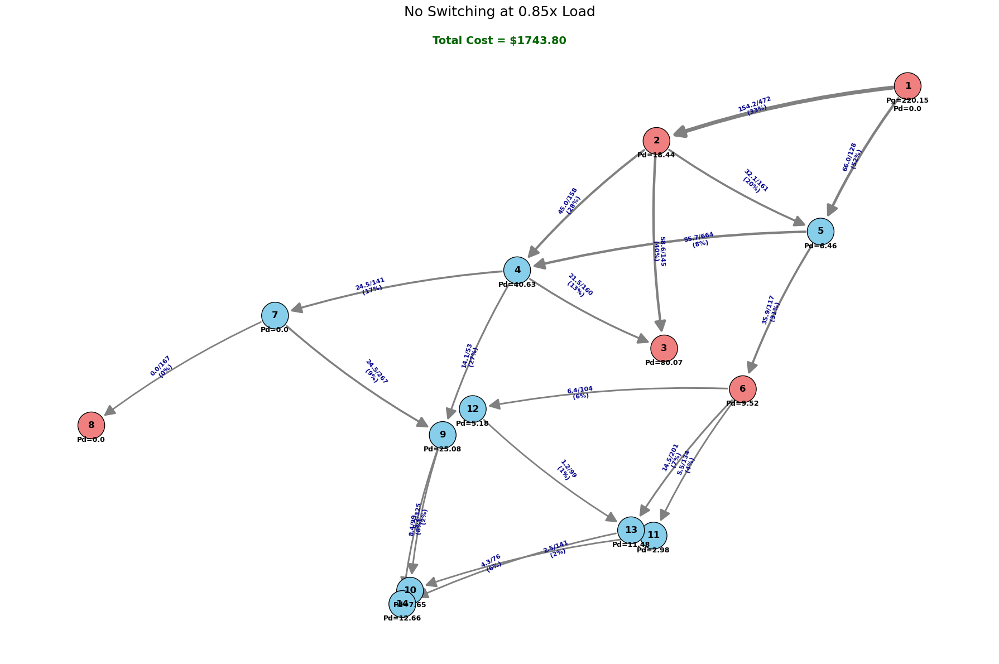

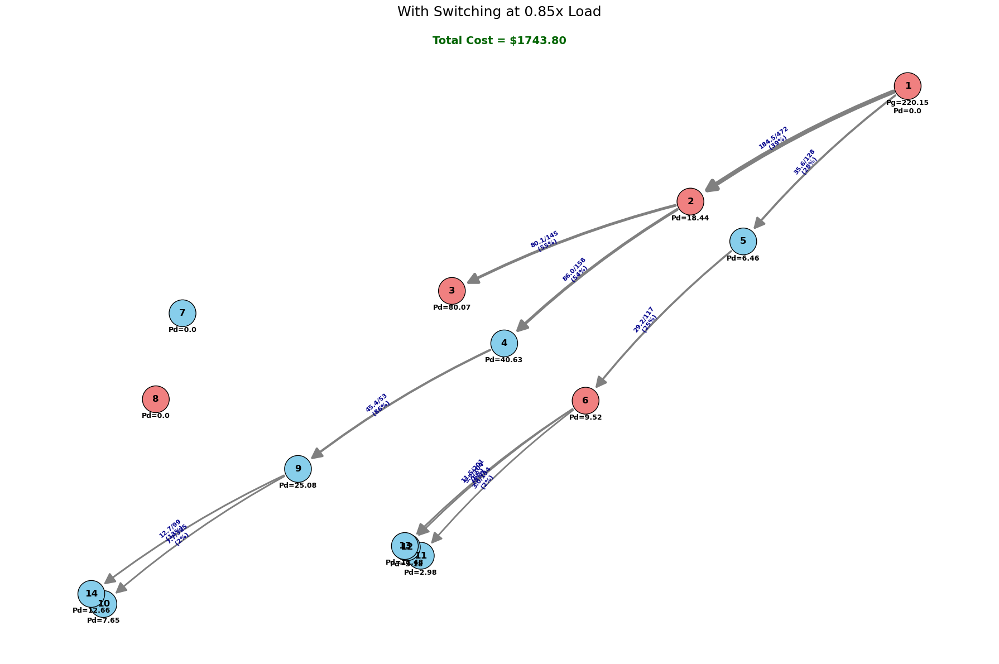


✓ Load study comparison saved to 'load_study_comparison.csv'
✓ Line switching frequency saved to 'line_switching_frequency.csv'
✓ Branch comparison at 0.85x load saved to 'branch_comparison_0.85x.csv'


In [11]:
# ### 13.1 Side-by-Side Visualizations

# %%
visualize_opf_results(bus_nosw, branch_nosw, gen_df, f"No Switching at {target_scale:.2f}x Load")

# %%
visualize_opf_results(bus_withsw, branch_withsw, gen_df, f"With Switching at {target_scale:.2f}x Load")

# ## 14. Export Results

# %%
# Export key results to CSV files for further analysis
study_comparison.to_csv('load_study_comparison.csv', index=False)
print("\n✓ Load study comparison saved to 'load_study_comparison.csv'")

if len(line_off_counts) > 0:
    line_off_counts.to_csv('line_switching_frequency.csv', index=False)
    print("✓ Line switching frequency saved to 'line_switching_frequency.csv'")

# Save detailed results for the target scenario
branch_comparison = pd.merge(
    branch_nosw[['Line', 'From', 'To', 'Flow (MW)', 'Utilization (%)', 'Congested']],
    branch_withsw[['Line', 'Flow (MW)', 'Utilization (%)', 'Congested', 'Status']],
    on='Line',
    suffixes=('_NoSw', '_WithSw')
)
branch_comparison.to_csv(f'branch_comparison_{target_scale:.2f}x.csv', index=False)
print(f"✓ Branch comparison at {target_scale:.2f}x load saved to 'branch_comparison_{target_scale:.2f}x.csv'")


In [12]:
# ## 15. Summary and Conclusions

# %%
print("\n" + "="*70)
print(" "*20 + "FINAL SUMMARY")
print("="*70)

print("\n1. MODEL VALIDATION:")
print("   ✓ DC-OPF with binary switching variables converges successfully")
print("   ✓ Both linear (no switching) and MILP (with switching) models are feasible")

print("\n2. SWITCHING BENEFITS:")
print(f"   - Cost reduction: {avg_savings_pct:.2f}% on average across load scenarios")
print(f"   - Congestion relief: {avg_congestion_reduction:.1f} fewer congested lines on average")
print(f"   - Peak benefit at {study_comparison.loc[study_comparison['cost_savings'].idxmax(), 'scale']:.2f}x load")

print("\n3. OPERATIONAL INSIGHTS:")
print(f"   - Topology switching becomes most beneficial as load increases")
print(f"   - Switching helps redistribute power flow to avoid bottlenecks")
print(f"   - Average of {avg_lines_off:.1f} lines switched off across scenarios")

if len(line_off_counts) > 0:
    most_switched = line_off_counts.iloc[0]
    print(f"   - Most frequently switched line: {int(most_switched['line'])} ({int(most_switched['from'])}→{int(most_switched['to'])})")
    print(f"     Switched off in {int(most_switched['times_off'])}/{len(study_with_switch)} scenarios")

print("\n4. NETWORK CHARACTERISTICS:")
print(f"   - Base system load: {bus_df['Pd'].sum():.2f} MW")
print(f"   - Total generation capacity: {gen_df['Pmax'].sum():.2f} MW")
print(f"   - Load scenarios tested: {len(study_no_switch)} (from {study_no_switch['scale'].min():.2f}x to {study_no_switch['scale'].max():.2f}x)")

print("\n5. NEXT STEPS:")
print("   → Analyze specific congested corridors in detail")
print("   → Test on larger systems (e.g., IEEE 30-bus, 57-bus, 118-bus)")
print("   → Incorporate N-1 security constraints")
print("   → Study impact of renewable generation variability")

print("\n" + "="*70)
print("Analysis complete! All results saved to CSV files.")
print("="*70 + "\n")


                    FINAL SUMMARY

1. MODEL VALIDATION:
   ✓ DC-OPF with binary switching variables converges successfully
   ✓ Both linear (no switching) and MILP (with switching) models are feasible

2. SWITCHING BENEFITS:
   - Cost reduction: 0.00% on average across load scenarios
   - Congestion relief: -0.2 fewer congested lines on average
   - Peak benefit at 0.85x load

3. OPERATIONAL INSIGHTS:
   - Topology switching becomes most beneficial as load increases
   - Switching helps redistribute power flow to avoid bottlenecks
   - Average of 7.5 lines switched off across scenarios
   - Most frequently switched line: 13 (7→8)
     Switched off in 21/21 scenarios

4. NETWORK CHARACTERISTICS:
   - Base system load: 259.00 MW
   - Total generation capacity: 399.00 MW
   - Load scenarios tested: 21 (from 0.85x to 1.20x)

5. NEXT STEPS:
   → Analyze specific congested corridors in detail
   → Test on larger systems (e.g., IEEE 30-bus, 57-bus, 118-bus)
   → Incorporate N-1 security cons